# Installation and Imports

In [1]:
!pip install -q "transformers>=4.46.0" "accelerate>=1.1.0" peft datasets

In [2]:
%pip install -q \
    torch  \
    datasets \
    accelerate \
    numpy \
    pandas \
    scikit-learn \
    matplotlib \
    seaborn \
    wordcloud \
    emoji \
    nltk \
    shap \
    lime

In [3]:
#  Imports & Global Setup

import os, re, sys, random, unicodedata
from io import StringIO

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from IPython.display import display
from wordcloud import WordCloud

# Sklearn – preprocessing & classical ML
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn.preprocessing import label_binarize
from sklearn.utils.class_weight import compute_class_weight
from sklearn.feature_extraction.text import TfidfVectorizer, CountVectorizer
from sklearn.decomposition import TruncatedSVD
from sklearn.linear_model import LogisticRegression
from sklearn.svm import LinearSVC
from sklearn.calibration import CalibratedClassifierCV
from sklearn.metrics import (
    classification_report,
    confusion_matrix,
    ConfusionMatrixDisplay,
    roc_auc_score,
    roc_curve,
    accuracy_score,
    precision_recall_fscore_support,
)

from scipy.sparse import hstack, csr_matrix
from scipy.special import softmax

# NLP / cleaning
import emoji
import nltk
from nltk import word_tokenize, pos_tag
from nltk.stem import WordNetLemmatizer
from nltk.corpus import wordnet

# Deep learning – Keras / TensorFlow
import tensorflow as tf
from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing.sequence import pad_sequences
from tensorflow.keras import layers, models
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint

# Explainability
import shap
from lime.lime_text import LimeTextExplainer

# Transformers / Torch / PEFT
import torch
from transformers import (
    AutoTokenizer,
    AutoModelForSequenceClassification,
    AutoModelForCausalLM,
    DataCollatorWithPadding,
    DataCollatorForLanguageModeling,
    TrainingArguments,
)
from peft import LoraConfig, get_peft_model, TaskType

# Plot style
sns.set(style="whitegrid")

# Reproducibility
RANDOM_SEED = 42
random.seed(RANDOM_SEED)
np.random.seed(RANDOM_SEED)
tf.random.set_seed(RANDOM_SEED)
torch.manual_seed(RANDOM_SEED)

# NLTK resources
import nltk
for pkg in [
    "punkt",
    "punkt_tab",
    "averaged_perceptron_tagger",
    "averaged_perceptron_tagger_eng",
    "wordnet",
    "omw-1.4",
]:
    nltk.download(pkg, quiet=True)

print("SETUP COMPLETE")
print("PyTorch:", torch.__version__)
print("TensorFlow:", tf.__version__)

SETUP COMPLETE
PyTorch: 2.9.0+cu126
TensorFlow: 2.19.0


# Initial Data Loading and Cleaning

In [4]:
import os
import numpy as np
import pandas as pd

def percent_to_float(x):
    if pd.isna(x):
        return np.nan
    if isinstance(x, str):
        x = x.strip()
        if x.endswith("%"):
            x = x[:-1]
        try:
            return float(x)
        except:
            return np.nan
    try:
        return float(x)
    except:
        return np.nan


def drop_unnamed(df):
    return df.loc[:, ~df.columns.str.startswith("Unnamed:")]


def robust_read_csv(filename, base_path="."):
    path = os.path.join(base_path, filename)
    try:
        return pd.read_csv(
            path,
            engine="python",
            encoding="latin1",
            on_bad_lines="skip"   # tolerate bad lines
        )
    except Exception as e:
        print(f"Python engine failed for {path}:", e)
        print("Retrying with more relaxed settings...")
        return pd.read_csv(
            path,
            engine="python",
            encoding="latin1",
            on_bad_lines="skip",
            sep=",",
            quotechar='"',
            encoding_errors="ignore",
        )


def load_and_clean_raw_datasets(base_path="."):
    rmp = robust_read_csv("1_He_2020_RMP_v2_with_sampling_criteria.csv", base_path)
    waterloo = robust_read_csv("2_Uwaterloo_course_reviews_with_sampling_criteria.csv", base_path)
    exeter = robust_read_csv("3_UExeter_uni_reviews_with_sampling_criteria.csv", base_path)

    print("RAW SHAPES:", rmp.shape, waterloo.shape, exeter.shape)

    # Drop unnamed columns
    rmp = drop_unnamed(rmp)
    waterloo = drop_unnamed(waterloo)
    exeter = drop_unnamed(exeter)

    # Ensure num_token is numeric where present
    for df in [rmp, waterloo, exeter]:
        if "num_token" in df.columns:
            df["num_token"] = pd.to_numeric(df["num_token"], errors="coerce")

    # Filter to valid rating_cat values in RMP
    if "rating_cat" in rmp.columns:
        rmp = rmp[rmp["rating_cat"].isin(["Pos", "Neg", "Conf/Neu"])]

    # Clean rating_cat in Waterloo
    if "rating_cat" in waterloo.columns:
        waterloo.loc[waterloo["rating_cat"] == "[NA]", "rating_cat"] = np.nan
        waterloo = waterloo.dropna(subset=["rating_cat"])

    # Convert percentage-like fields in Waterloo
    for col in ["useful", "easy", "liked"]:
        if col in waterloo.columns:
            waterloo[col] = waterloo[col].apply(percent_to_float)

    # Reset indices
    rmp = rmp.reset_index(drop=True)
    waterloo = waterloo.reset_index(drop=True)
    exeter = exeter.reset_index(drop=True)

    print("CLEANED SHAPES:", rmp.shape, waterloo.shape, exeter.shape)

    return rmp, waterloo, exeter


# RUN IT
df_rmp, df_waterloo, df_exeter = load_and_clean_raw_datasets()


RAW SHAPES: (19145, 96) (14810, 21) (557, 19)
CLEANED SHAPES: (19144, 14) (14589, 20) (557, 18)


# Unified schema + merged df_all (teacher / course / university)

In [5]:
UNIFIED_COLS = [
    "global_id",
    "dataset",
    "entity_type",
    "source_id",
    "review_text",
    "rating",
    "rating_bin",
    "rating_cat",
    "num_token",
    "length_bin",
    "sample_criteria",
    "department",
    "teacher_name",
    "course_code",
    "course_name",
    "num_ratings",
    "num_reviews",
    "useful",
    "easy",
    "liked",
    "student_id",
    "date",
    "rating_facilities",
    "rating_clubs",
    "rating_careerService",
    "rating_internet",
]

DEFAULTS = {
    "global_id": "",
    "dataset": "",
    "entity_type": "",
    "source_id": "",
    "review_text": "",
    "rating": 0.0,
    "rating_bin": 0,
    "rating_cat": "unknown",
    "num_token": 0,
    "length_bin": 0,
    "sample_criteria": "unknown",
    "department": "",
    "teacher_name": "",
    "course_code": "",
    "course_name": "",
    "num_ratings": 0,
    "num_reviews": 0,
    "useful": 0.0,
    "easy": 0.0,
    "liked": 0.0,
    "student_id": "",
    "date": "",
    "rating_facilities": 0.0,
    "rating_clubs": 0.0,
    "rating_careerService": 0.0,
    "rating_internet": 0.0,
}


def fill_missing_cols(df, cols, defaults):
    for c in cols:
        if c not in df.columns:
            df[c] = defaults.get(c, "")
    return df[cols]


def build_unified_df(df_rmp, df_waterloo, df_exeter):
    # RMP (teacher)
    rmp_u = pd.DataFrame(index=df_rmp.index)
    rmp_u["dataset"] = "rmp"
    rmp_u["entity_type"] = "teacher"
    rmp_u["source_id"] = df_rmp["id"]
    rmp_u["global_id"] = "rmp_" + df_rmp["id"].astype(str)
    rmp_u["review_text"] = df_rmp["review_text"]
    rmp_u["rating"] = df_rmp["rating"]
    rmp_u["rating_bin"] = df_rmp["rating_bin"]
    rmp_u["rating_cat"] = df_rmp["rating_cat"]
    rmp_u["num_token"] = df_rmp["num_token"]
    rmp_u["length_bin"] = df_rmp["length_bin"]
    rmp_u["sample_criteria"] = df_rmp["sample_criteria"]
    rmp_u["department"] = df_rmp["department"]
    rmp_u["teacher_name"] = df_rmp["teacher_name"]
    rmp_u = fill_missing_cols(rmp_u, UNIFIED_COLS, DEFAULTS)

    # Waterloo (course)
    waterloo_u = pd.DataFrame(index=df_waterloo.index)
    waterloo_u["dataset"] = "waterloo"
    waterloo_u["entity_type"] = "course"
    waterloo_u["source_id"] = df_waterloo["id"]
    waterloo_u["global_id"] = "waterloo_" + df_waterloo["id"].astype(str)
    waterloo_u["review_text"] = df_waterloo["review_text"]
    waterloo_u["rating"] = df_waterloo["rating"]
    waterloo_u["rating_bin"] = df_waterloo["rating_bin"]
    waterloo_u["rating_cat"] = df_waterloo["rating_cat"]
    waterloo_u["num_token"] = df_waterloo.get("num_token", 0)
    waterloo_u["length_bin"] = df_waterloo.get("length_bin", 0)
    waterloo_u["sample_criteria"] = df_waterloo.get("sample_criteria", "unknown")
    waterloo_u["course_code"] = df_waterloo.get("course_code", "")
    waterloo_u["course_name"] = df_waterloo.get("course_id", "")
    waterloo_u["num_ratings"] = df_waterloo.get("num_ratings", 0)
    waterloo_u["num_reviews"] = df_waterloo.get("num_reviews", 0)
    waterloo_u["useful"] = df_waterloo.get("useful", 0.0)
    waterloo_u["easy"] = df_waterloo.get("easy", 0.0)
    waterloo_u["liked"] = df_waterloo.get("liked", 0.0)
    waterloo_u = fill_missing_cols(waterloo_u, UNIFIED_COLS, DEFAULTS)

    # Exeter (university)
    exeter_u = pd.DataFrame(index=df_exeter.index)
    exeter_u["dataset"] = "exeter"
    exeter_u["entity_type"] = "university"
    exeter_u["source_id"] = df_exeter["id"]
    exeter_u["global_id"] = "exeter_" + df_exeter["id"].astype(str)
    exeter_u["review_text"] = df_exeter["review_text"]
    exeter_u["rating"] = df_exeter["rating"]
    exeter_u["rating_bin"] = df_exeter["rating_bin"]
    exeter_u["rating_cat"] = df_exeter["rating_cat"]
    exeter_u["num_token"] = df_exeter.get("num_token", 0)
    exeter_u["length_bin"] = df_exeter.get("length_bin", 0)
    exeter_u["sample_criteria"] = df_exeter.get("sample_criteria", "unknown")
    exeter_u["student_id"] = df_exeter.get("student_id", "")
    exeter_u["date"] = df_exeter.get("date", "")
    exeter_u["rating_facilities"] = df_exeter.get("rating_facilities", 0.0)
    exeter_u["rating_clubs"] = df_exeter.get("rating_clubs", 0.0)
    exeter_u["rating_careerService"] = df_exeter.get("rating_careerService", 0.0)
    exeter_u["rating_internet"] = df_exeter.get("rating_internet", 0.0)
    exeter_u = fill_missing_cols(exeter_u, UNIFIED_COLS, DEFAULTS)

    df_all = pd.concat([rmp_u, waterloo_u, exeter_u], ignore_index=True)
    df_all = df_all[df_all["rating_cat"].isin(["Neg", "Conf/Neu", "Pos"])].reset_index(drop=True)

    df_all["dataset"] = df_all["dataset"].astype("category")
    df_all["entity_type"] = df_all["entity_type"].astype("category")

    print("Unified shape:", df_all.shape)
    print("\nDatasets:")
    print(df_all["dataset"].value_counts())
    print("\nEntity types:")
    print(df_all["entity_type"].value_counts())
    print("\nLabels:")
    print(df_all["rating_cat"].value_counts())

    return df_all
df_unified = build_unified_df(df_rmp, df_waterloo, df_exeter)
unified_path = "df_unified_raw_clean.csv"
df_unified.to_csv(unified_path, index=False)
print(f"\nSaved unified dataset to: {unified_path}")

Unified shape: (34290, 26)

Datasets:
dataset
rmp         19144
waterloo    14589
exeter        557
Name: count, dtype: int64

Entity types:
entity_type
teacher       19144
course        14589
university      557
Name: count, dtype: int64

Labels:
rating_cat
Pos         20153
Neg          9564
Conf/Neu     4573
Name: count, dtype: int64

Saved unified dataset to: df_unified_raw_clean.csv


In [6]:
# Unified Dataset Summary Block
df_unified["useful"] = df_unified["useful"].fillna(0.0)
df_unified["easy"] = df_unified["easy"].fillna(0.0)
df_unified["student_id"] = df_unified["student_id"].fillna("")

df_all = df_unified.copy()

print("\n===== SHAPE =====")
print(df_all.shape)

print("\n===== COLUMNS =====")
print(df_all.columns.tolist())

print("\n===== DATA TYPES =====")
print(df_all.dtypes)

print("\n===== HEAD =====")
display(df_all.head())

print("\n===== TAIL =====")
display(df_all.tail())

print("\n===== NULL VALUES =====")
print(df_all.isna().sum())

print("\n===== BASIC DESCRIPTIVE STATS =====")
display(df_all.describe(include="all"))

print("\n===== VALUE COUNTS: dataset =====")
print(df_all["dataset"].value_counts())

print("\n===== VALUE COUNTS: entity_type =====")
print(df_all["entity_type"].value_counts())

print("\n===== VALUE COUNTS: rating_cat =====")
print(df_all["rating_cat"].value_counts())

print("\n===== TEXT LENGTH STATS =====")
df_all["review_length"] = df_all["review_text"].astype(str).apply(len)
print(df_all["review_length"].describe())

print("\n===== TOKEN COUNT STATS =====")
print(df_all["num_token"].describe())

print("\n===== DUPLICATE CHECK =====")
print("Duplicates:", df_all.duplicated().sum())

print("\n===== MEMORY USAGE =====")
df_all.info(memory_usage="deep")



===== SHAPE =====
(34290, 26)

===== COLUMNS =====
['global_id', 'dataset', 'entity_type', 'source_id', 'review_text', 'rating', 'rating_bin', 'rating_cat', 'num_token', 'length_bin', 'sample_criteria', 'department', 'teacher_name', 'course_code', 'course_name', 'num_ratings', 'num_reviews', 'useful', 'easy', 'liked', 'student_id', 'date', 'rating_facilities', 'rating_clubs', 'rating_careerService', 'rating_internet']

===== DATA TYPES =====
global_id                 object
dataset                 category
entity_type             category
source_id                 object
review_text               object
rating                   float64
rating_bin                object
rating_cat                object
num_token                float64
length_bin                object
sample_criteria           object
department                object
teacher_name              object
course_code               object
course_name               object
num_ratings                int64
num_reviews              

,global_id,dataset,entity_type,source_id,review_text,rating,rating_bin,rating_cat,num_token,length_bin,...,num_reviews,useful,easy,liked,student_id,date,rating_facilities,rating_clubs,rating_careerService,rating_internet
0,rmp_1_90_2430_1,rmp,teacher,1_90_2430_1,"Never trust yourself, you would be surprised b...",1.0,"(0.999, 2.5]",Neg,27.0,"(21.0, 41.0]",...,0,0.0,0.0,0.0,,,0.0,0.0,0.0,0.0
1,rmp_1_236_180_2,rmp,teacher,1_236_180_2,"This class is an easy A, but don\'t expect to ...",1.0,"(0.999, 2.5]",Neg,75.0,"(61.0, 81.0]",...,0,0.0,0.0,0.0,,,0.0,0.0,0.0,0.0
2,rmp_1_182_1691_3,rmp,teacher,1_182_1691_3,Overall terrible experience.,1.0,"(0.999, 2.5]",Neg,4.0,"(0.999, 21.0]",...,0,0.0,0.0,0.0,,,0.0,0.0,0.0,0.0
3,rmp_1_40_401_4,rmp,teacher,1_40_401_4,He did not teach me a single thing. I went int...,1.0,"(0.999, 2.5]",Neg,73.0,"(61.0, 81.0]",...,0,0.0,0.0,0.0,,,0.0,0.0,0.0,0.0
4,rmp_1_37_1575_5,rmp,teacher,1_37_1575_5,Not a bad professor as he is very passionate a...,1.0,"(0.999, 2.5]",Neg,66.0,"(61.0, 81.0]",...,0,0.0,0.0,0.0,,,0.0,0.0,0.0,0.0



===== TAIL =====


,global_id,dataset,entity_type,source_id,review_text,rating,rating_bin,rating_cat,num_token,length_bin,...,num_reviews,useful,easy,liked,student_id,date,rating_facilities,rating_clubs,rating_careerService,rating_internet
34285,exeter_3_553_1_182,exeter,university,3_553_1_182,Brilliant university; beautiful campus; active...,4.7,"(4.0, 5.0]",Pos,29.0,"(21.0, 41.0]",...,0,0.0,0.0,0.0,,25th March 15,5.0,5.0,5.0,5.0
34286,exeter_3_554_1_182,exeter,university,3_554_1_182,Sport membership is very expensive,4.3,"(4.0, 5.0]",Pos,5.0,"(0.999, 21.0]",...,0,0.0,0.0,0.0,,25th March 15,4.0,5.0,5.0,5.0
34287,exeter_3_555_1_182,exeter,university,3_555_1_182,It is great! But there should be a swimming po...,4.3,"(4.0, 5.0]",Pos,14.0,"(0.999, 21.0]",...,0,0.0,0.0,0.0,,25th March 15,4.0,5.0,5.0,5.0
34288,exeter_3_556_1_182,exeter,university,3_556_1_182,ITS AMAZING! I love my university and wouldn't...,4.7,"(4.0, 5.0]",Pos,15.0,"(0.999, 21.0]",...,0,0.0,0.0,0.0,,25th March 15,5.0,5.0,5.0,5.0
34289,exeter_3_557_1_92,exeter,university,3_557_1_92,Exeter is a wonderful place to live and the un...,4.8,"(4.0, 5.0]",Pos,15.0,"(0.999, 21.0]",...,0,0.0,0.0,0.0,,17th March 15,5.0,5.0,5.0,5.0



===== NULL VALUES =====
global_id               0
dataset                 0
entity_type             0
source_id               0
review_text             0
rating                  0
rating_bin              0
rating_cat              0
num_token               0
length_bin              0
sample_criteria         0
department              0
teacher_name            0
course_code             0
course_name             0
num_ratings             0
num_reviews             0
useful                  0
easy                    0
liked                   0
student_id              0
date                    0
rating_facilities       0
rating_clubs            0
rating_careerService    0
rating_internet         0
dtype: int64

===== BASIC DESCRIPTIVE STATS =====


,global_id,dataset,entity_type,source_id,review_text,rating,rating_bin,rating_cat,num_token,length_bin,...,num_reviews,useful,easy,liked,student_id,date,rating_facilities,rating_clubs,rating_careerService,rating_internet
count,34290,34290,34290,34290,34290,34290.000000,34290,34290,34290.000000,34290,...,34290.000000,34290.000000,34290.000000,34290.000000,34290,34290,34290.000000,34290.000000,34290.000000,34290.000000
unique,34290,3,3,34290,34095,NaN,5,3,NaN,29,...,NaN,NaN,NaN,NaN,528,295,NaN,NaN,NaN,NaN
top,exeter_3_557_1_92,rmp,teacher,3_557_1_92,Fun course,NaN,"(4.0, 5.0]",Pos,NaN,"(0.999, 21.0]",...,NaN,NaN,NaN,NaN,,,NaN,NaN,NaN,NaN
freq,1,19144,19144,1,8,NaN,10375,20153,NaN,8512,...,NaN,NaN,NaN,NaN,33763,33733,NaN,NaN,NaN,NaN
mean,NaN,NaN,NaN,NaN,NaN,2.460052,NaN,NaN,46.449694,NaN,...,19.516127,29.841266,25.351123,27.873374,NaN,NaN,0.075620,0.073141,0.071362,0.071595
std,NaN,NaN,NaN,NaN,NaN,1.896281,NaN,NaN,35.680658,NaN,...,42.180343,37.777885,33.006879,35.300611,NaN,NaN,0.594749,0.578130,0.565734,0.568533
min,NaN,NaN,NaN,NaN,NaN,0.000000,NaN,NaN,1.000000,NaN,...,0.000000,0.000000,0.000000,0.000000,NaN,NaN,0.000000,0.000000,0.000000,0.000000
25%,NaN,NaN,NaN,NaN,NaN,1.000000,NaN,NaN,22.000000,NaN,...,0.000000,0.000000,0.000000,0.000000,NaN,NaN,0.000000,0.000000,0.000000,0.000000
50%,NaN,NaN,NaN,NaN,NaN,1.500000,NaN,NaN,43.000000,NaN,...,0.000000,0.000000,0.000000,0.000000,NaN,NaN,0.000000,0.000000,0.000000,0.000000
75%,NaN,NaN,NaN,NaN,NaN,4.500000,NaN,NaN,66.000000,NaN,...,15.000000,70.000000,57.000000,62.000000,NaN,NaN,0.000000,0.000000,0.000000,0.000000



===== VALUE COUNTS: dataset =====
dataset
rmp         19144
waterloo    14589
exeter        557
Name: count, dtype: int64

===== VALUE COUNTS: entity_type =====
entity_type
teacher       19144
course        14589
university      557
Name: count, dtype: int64

===== VALUE COUNTS: rating_cat =====
rating_cat
Pos         20153
Neg          9564
Conf/Neu     4573
Name: count, dtype: int64

===== TEXT LENGTH STATS =====
count    34290.000000
mean       225.554885
std        174.883350
min          1.000000
25%        106.000000
50%        207.000000
75%        323.000000
max       4215.000000
Name: review_length, dtype: float64

===== TOKEN COUNT STATS =====
count    34290.000000
mean        46.449694
std         35.680658
min          1.000000
25%         22.000000
50%         43.000000
75%         66.000000
max        856.000000
Name: num_token, dtype: float64

===== DUPLICATE CHECK =====
Duplicates: 0

===== MEMORY USAGE =====
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 34290 entr

# Advanced Data Cleaning

In [7]:
# Strong pre-clean
def strong_preclean(text):
    if pd.isna(text):
        return ""
    text = str(text)
    text = unicodedata.normalize("NFKC", text)

    text = re.sub(r"#NAME\?", " ", text, flags=re.IGNORECASE)
    text = emoji.demojize(text, delimiters=(" ", " "))

    text = text.replace("’", "'").replace("`", "'")
    text = text.replace("'", " ")

    text = re.sub(r"([!?]){2,}", r"\1", text)
    text = re.sub(r"\.{2,}", ".", text)
    text = re.sub(r"[\r\n\t]+", " ", text)
    text = re.sub(r"[^A-Za-z0-9\s\.\,\!\?\:\;\-]", " ", text)

    text = re.sub(r"\bdon\s+t\b", "dont",  text, flags=re.IGNORECASE)
    text = re.sub(r"\bdidn\s+t\b", "didnt", text, flags=re.IGNORECASE)
    text = re.sub(r"\bcan\s+t\b", "cant",  text, flags=re.IGNORECASE)
    text = re.sub(r"\bwon\s+t\b", "wont",  text, flags=re.IGNORECASE)
    text = re.sub(r"\bisn\s+t\b", "isnt",  text, flags=re.IGNORECASE)
    text = re.sub(r"\baren\s+t\b", "arent", text, flags=re.IGNORECASE)
    text = re.sub(r"\bshouldn\s+t\b", "shouldnt", text, flags=re.IGNORECASE)

    text = re.sub(r"\s+", " ", text).strip()
    return text

print("Running strong_preclean on review_text...")
df_all["review_text_pre"] = df_all["review_text"].apply(strong_preclean)

print("\nSample pre-cleaned rows:")
display(df_all[["review_text", "review_text_pre"]].head(5))


Running strong_preclean on review_text...

Sample pre-cleaned rows:


,review_text,review_text_pre
0,"Never trust yourself, you would be surprised b...","Never trust yourself, you would be surprised b..."
1,"This class is an easy A, but don\'t expect to ...","This class is an easy A, but dont expect to le..."
2,Overall terrible experience.,Overall terrible experience.
3,He did not teach me a single thing. I went int...,He did not teach me a single thing. I went int...
4,Not a bad professor as he is very passionate a...,Not a bad professor as he is very passionate a...


In [8]:
# Advanced cleaning
print("NLTK resources ready.")
lemmatizer = WordNetLemmatizer()

NEGATIONS = {
    "not", "no", "never", "n't",
    "dont", "didnt", "cant", "cannot", "wont"
}

TEACHER_PAT = re.compile(
    r"\b(prof|professor|dr|mr|mrs|ms)\.?\s+[a-z][a-z]+\b",
    flags=re.IGNORECASE
)

def get_wordnet_pos(tag: str):
    if tag.startswith("J"): return wordnet.ADJ
    if tag.startswith("V"): return wordnet.VERB
    if tag.startswith("N"): return wordnet.NOUN
    if tag.startswith("R"): return wordnet.ADV
    return wordnet.NOUN

def advanced_clean(text: str) -> str:
    if pd.isna(text) or not str(text).strip():
        return ""

    text = str(text).lower()
    text = TEACHER_PAT.sub(" teacher ", text)

    tokens = word_tokenize(text)

    out_tokens = []
    neg_scope = 0
    NEG_SCOPE_LEN = 3

    for tok in tokens:
        if tok in NEGATIONS:
            out_tokens.append(tok)
            neg_scope = NEG_SCOPE_LEN
            continue

        if neg_scope > 0 and tok.isalpha():
            out_tokens.append("neg_" + tok)
            neg_scope -= 1
        else:
            out_tokens.append(tok)

        if tok in [".", "!", "?"]:
            neg_scope = 0

    pos_tags = pos_tag(out_tokens)

    clean_tokens = []
    for tok, tag in pos_tags:
        prefix = ""
        base = tok

        if tok.startswith("neg_"):
            prefix = "neg_"
            base = tok[4:]

        if not base.isalpha():
            continue

        lemma = lemmatizer.lemmatize(base, pos=get_wordnet_pos(tag))
        if len(lemma) <= 1:
            continue

        clean_tokens.append(prefix + lemma)

    return " ".join(clean_tokens)

print("Cleaning with advanced_clean...")
df_all["text_clean"] = df_all["review_text_pre"].apply(advanced_clean)
df_all["clean_len"] = df_all["text_clean"].str.split().str.len()

before = len(df_all)
df_all = df_all[df_all["text_clean"].str.strip().str.len() > 0].reset_index(drop=True)
after = len(df_all)

print(f"\nRows before cleaning: {before}")
print(f"Rows after cleaning:  {after}")
print("\nSample cleaned rows:")
display(df_all[["review_text", "review_text_pre", "text_clean"]].head(10))
print("\nLabel distribution after cleaning:")
print(df_all["rating_cat"].value_counts())


NLTK resources ready.
Cleaning with advanced_clean...

Rows before cleaning: 34290
Rows after cleaning:  34267

Sample cleaned rows:


,review_text,review_text_pre,text_clean
0,"Never trust yourself, you would be surprised b...","Never trust yourself, you would be surprised b...",never neg_trust neg_yourself neg_you would be ...
1,"This class is an easy A, but don\'t expect to ...","This class is an easy A, but dont expect to le...",this class be an easy but dont neg_expect neg_...
2,Overall terrible experience.,Overall terrible experience.,overall terrible experience
3,He did not teach me a single thing. I went int...,He did not teach me a single thing. I went int...,he do not neg_teach neg_me single thing go int...
4,Not a bad professor as he is very passionate a...,Not a bad professor as he is very passionate a...,not neg_bad neg_teacher he be very passionate ...
5,She sent an e-mail the weekend before the firs...,She sent an e-mail the weekend before the firs...,she send an the weekend before the first class...
6,Awful class and awful class setup. The entire ...,Awful class and awful class setup. The entire ...,awful class and awful class setup the entire s...
7,He was very rude and did not respect his stude...,He was very rude and did not respect his stude...,he be very rude and do not neg_respect neg_his...
8,Skip this teacher he is not caring makes tests...,Skip this teacher he is not caring makes tests...,skip this teacher he be not neg_caring neg_mak...
9,She\'s not easy. I would take other Bio 3 prof...,She s not easy. I would take other Bio 3 profe...,she not neg_easy would take other bio professor



Label distribution after cleaning:
rating_cat
Pos         20139
Neg          9557
Conf/Neu     4571
Name: count, dtype: int64


In [9]:
!pip install openpyxl
# Save cleaned dataset
df_all.to_csv("df_unified_clean_advanced.csv", index=False)
df_all.to_excel("df_unified_clean_advanced.xlsx", index=False)
print("\nSaved cleaned dataset to df_unified_clean_advanced.csv and .xlsx")

from google.colab import files
files.download("df_unified_clean_advanced.csv")


Saved cleaned dataset to df_unified_clean_advanced.csv and .xlsx


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [10]:
def full_data_report(df, name="DATASET", save_path="full_report.txt"):
    buffer = StringIO()
    stdout_original = sys.stdout
    sys.stdout = buffer

    print("="*70)
    print(f"FULL DATA REPORT — {name}")
    print("="*70)

    # 1. Basic Structure
    print("\nSHAPE:")
    print(df.shape)
    print("\nCOLUMNS:")
    print(df.columns.tolist())
    print("\nDATA TYPES:")
    print(df.dtypes)
    print("\nMEMORY USAGE (deep):")
    print(df.memory_usage(deep=True))

    # 2. Preview
    print("\nHEAD:")
    print(df.head(5))
    print("\nTAIL:")
    print(df.tail(5))

    # 3. Summary Stats
    num_cols = df.select_dtypes(include=["int64", "float64"]).columns
    print("\nDESCRIPTIVE STATS — NUMERIC:")
    print(df[num_cols].describe().T if len(num_cols) else "No numeric columns.")

    cat_cols = df.select_dtypes(include="object").columns
    print("\nDESCRIPTIVE STATS — CATEGORICAL:")
    print(df[cat_cols].describe().T if len(cat_cols) else "No object columns.")

    # 4. Missing Values
    print("\nMISSING VALUES:")
    missing = df.isna().sum()
    print(missing[missing > 0] if missing.sum() > 0 else "No missing values detected.")

    print("\nEMPTY STRINGS:")
    empty = (df.select_dtypes(include="object") == "").sum()
    empty = empty[empty > 0]
    print(empty if len(empty) else "No empty strings detected.")

    # 5. Duplicates
    print("\nDUPLICATE ROWS:")
    print(df.duplicated().sum())
    if "global_id" in df.columns:
        print("Duplicate global_id:", df["global_id"].duplicated().sum())

    # 6. Key Value Counts
    inspect_cols = ["dataset", "entity_type", "rating_cat"]
    print("\nKEY VALUE DISTRIBUTIONS:")
    for col in inspect_cols:
        if col in df.columns:
            print(f"\n{col}:")
            print(df[col].value_counts())

    # 7. Text Analysis
    if "review_text" in df.columns:
        print("\nREVIEW LENGTH STATS:")
        print(df["review_text"].str.len().describe())

    if "text_clean" in df.columns:
        print("\nCLEANED TEXT LENGTH STATS:")
        print(df["text_clean"].str.split().str.len().describe())

    # 8. Non-ASCII Check
    print("\nNON-ASCII CHARACTER COUNTS:")
    non_ascii = df.apply(lambda col: col.apply(
        lambda x: any(ord(c) > 127 for c in str(x))) if col.dtype == "object" else None
    )
    non_ascii_counts = non_ascii.sum()
    non_ascii_counts = non_ascii_counts[non_ascii_counts > 0]
    print(non_ascii_counts if len(non_ascii_counts) else "No non-ASCII characters found.")

    # 9. Quantiles
    if len(num_cols) > 0:
        print("\nQUANTILES (0.01 to 0.99):")
        print(df[num_cols].quantile([0.01, 0.25, 0.5, 0.75, 0.99]))

    print("\n" + "="*70)
    print("REPORT COMPLETE")
    print("="*70)

    # Restore print output to notebook
    sys.stdout = stdout_original
    report_text = buffer.getvalue()
    with open(save_path, "w", encoding="utf-8") as f:
        f.write(report_text)
    print(report_text)

    print(f"\nReport saved to: {save_path}")
full_data_report(df_all, name="Unified Cleaned Dataset", save_path="Unified_Cleaned_Report.txt")

FULL DATA REPORT — Unified Cleaned Dataset

SHAPE:
(34267, 30)

COLUMNS:
['global_id', 'dataset', 'entity_type', 'source_id', 'review_text', 'rating', 'rating_bin', 'rating_cat', 'num_token', 'length_bin', 'sample_criteria', 'department', 'teacher_name', 'course_code', 'course_name', 'num_ratings', 'num_reviews', 'useful', 'easy', 'liked', 'student_id', 'date', 'rating_facilities', 'rating_clubs', 'rating_careerService', 'rating_internet', 'review_length', 'review_text_pre', 'text_clean', 'clean_len']

DATA TYPES:
global_id                 object
dataset                 category
entity_type             category
source_id                 object
review_text               object
rating                   float64
rating_bin                object
rating_cat                object
num_token                float64
length_bin                object
sample_criteria           object
department                object
teacher_name              object
course_code               object
course_name       

In [11]:
final_cleaned_unified = df_all.copy()
df = final_cleaned_unified
print("Final cleaned dataset ready:")
print("Shape:", df.shape)
print(df["rating_cat"].value_counts())


Final cleaned dataset ready:
Shape: (34267, 30)
rating_cat
Pos         20139
Neg          9557
Conf/Neu     4571
Name: count, dtype: int64


# **Visual** **EDA**

## 1. Basic structure (label / dataset / entity distributions)

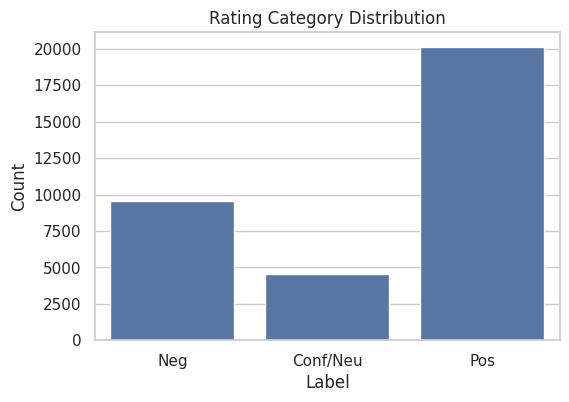

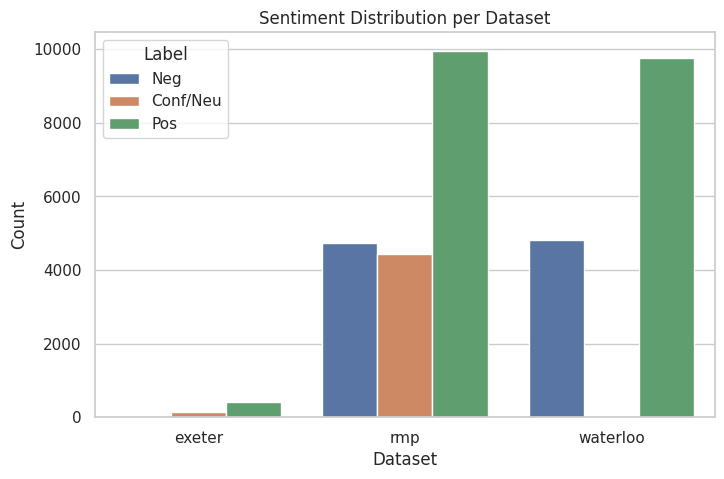

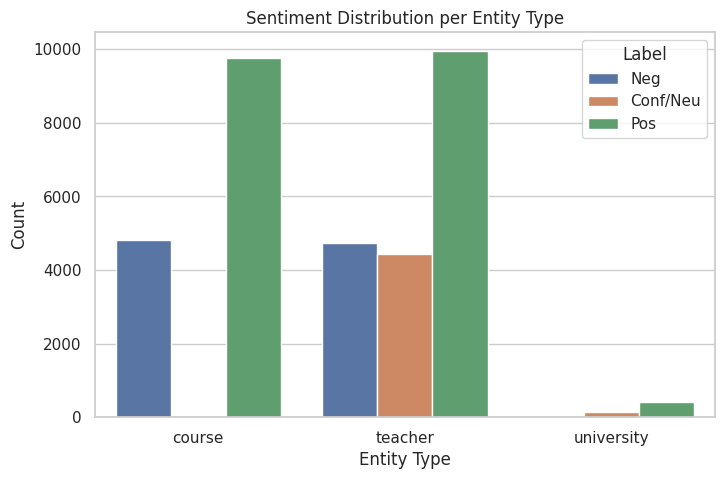

In [17]:
# Label distribution
plt.figure(figsize=(6,4))
sns.countplot(data=df, x="rating_cat", order=["Neg","Conf/Neu","Pos"])
plt.title("Rating Category Distribution")
plt.xlabel("Label")
plt.ylabel("Count")
plt.show()

# Dataset × label
plt.figure(figsize=(8,5))
sns.countplot(data=df, x="dataset", hue="rating_cat",
              hue_order=["Neg","Conf/Neu","Pos"])
plt.title("Sentiment Distribution per Dataset")
plt.xlabel("Dataset")
plt.ylabel("Count")
plt.legend(title="Label")
plt.show()

# Entity type × label
plt.figure(figsize=(8,5))
sns.countplot(data=df, x="entity_type", hue="rating_cat",
              hue_order=["Neg","Conf/Neu","Pos"])
plt.title("Sentiment Distribution per Entity Type")
plt.xlabel("Entity Type")
plt.ylabel("Count")
plt.legend(title="Label")
plt.show()


## 2. Text length

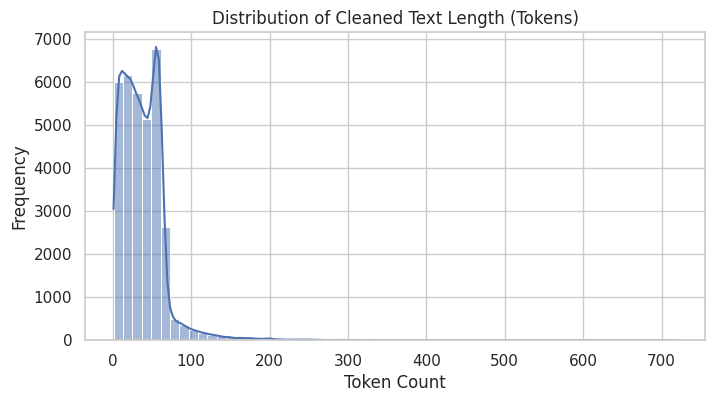

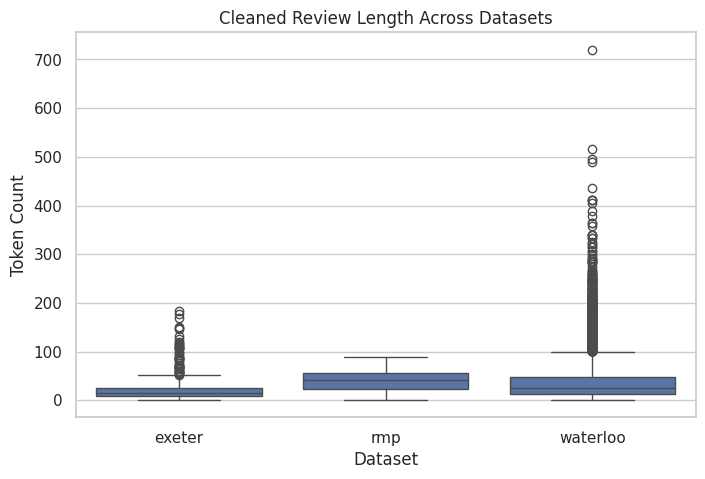

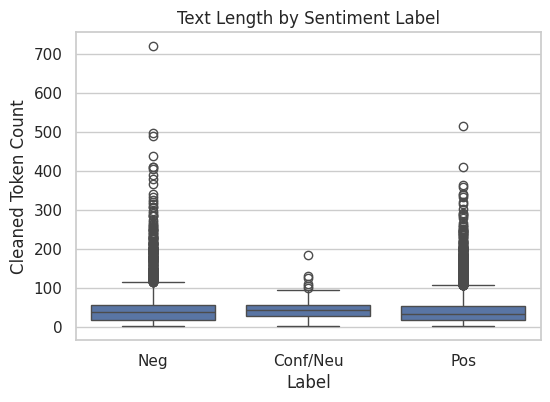

In [18]:
# Histogram of cleaned length
plt.figure(figsize=(8,4))
sns.histplot(df["clean_len"], bins=60, kde=True)
plt.title("Distribution of Cleaned Text Length (Tokens)")
plt.xlabel("Token Count")
plt.ylabel("Frequency")
plt.show()

# Boxplot by dataset
plt.figure(figsize=(8,5))
sns.boxplot(data=df, x="dataset", y="clean_len")
plt.title("Cleaned Review Length Across Datasets")
plt.xlabel("Dataset")
plt.ylabel("Token Count")
plt.show()

# Boxplot by label
plt.figure(figsize=(6,4))
sns.boxplot(data=df, x="rating_cat", y="clean_len",
            order=["Neg","Conf/Neu","Pos"])
plt.title("Text Length by Sentiment Label")
plt.xlabel("Label")
plt.ylabel("Cleaned Token Count")
plt.show()


## 3. Correlation heatmap of numeric features

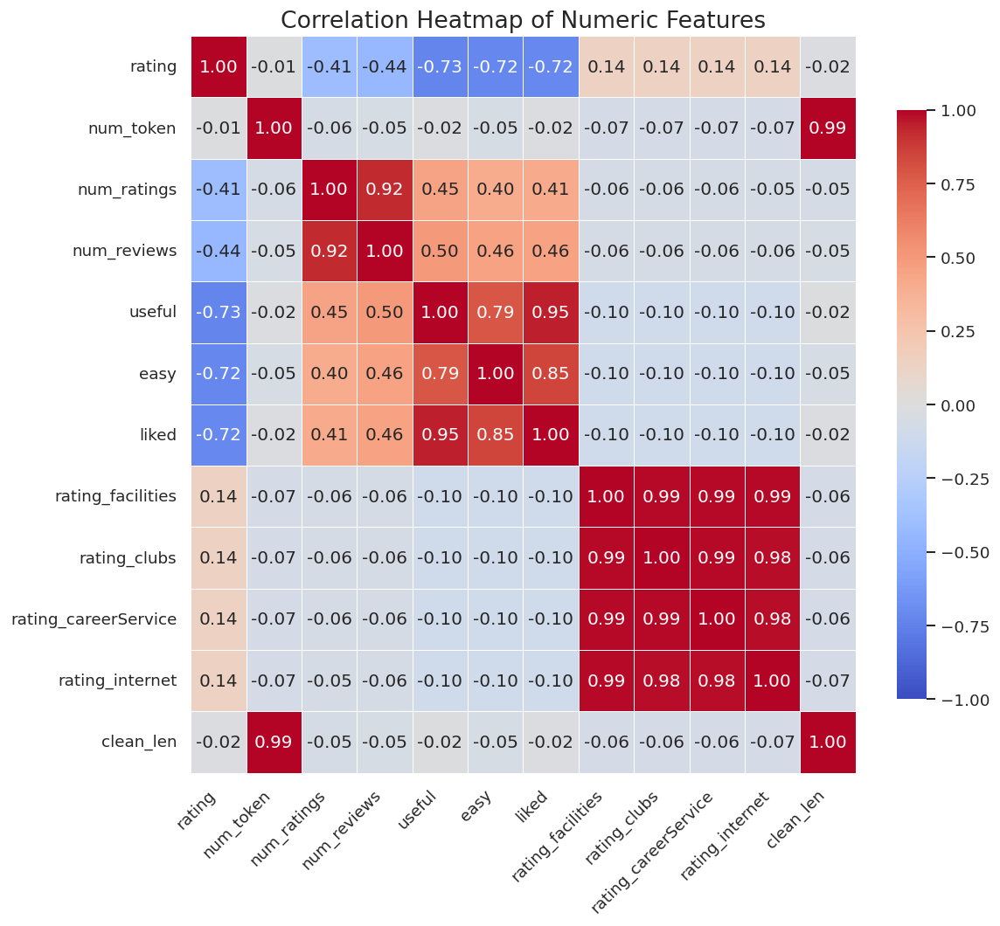

In [19]:
num_cols = [
    "rating","num_token","num_ratings","num_reviews",
    "useful","easy","liked",
    "rating_facilities","rating_clubs","rating_careerService",
    "rating_internet","clean_len"
]
corr = df[num_cols].corr()
plt.figure(figsize=(10,9), dpi=120)
sns.heatmap(
    corr, annot=True, fmt=".2f",
    cmap="coolwarm", vmin=-1, vmax=1,
    linewidths=0.5, cbar_kws={'shrink':0.8}
)
plt.title("Correlation Heatmap of Numeric Features", fontsize=16)
plt.xticks(rotation=45, ha="right")
plt.yticks(rotation=0)
plt.tight_layout()
plt.show()

## 4. WordClouds (global + by label)

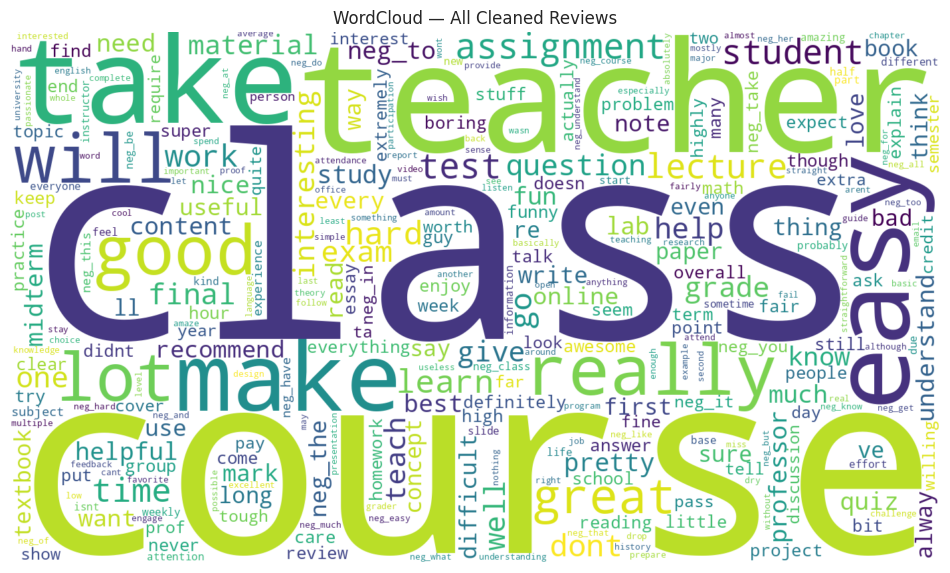

In [20]:
# Global WC
all_text = " ".join(df["text_clean"].tolist())
wc = WordCloud(width=1400, height=800,
               background_color="white",
               max_words=300, collocations=False).generate(all_text)

plt.figure(figsize=(12,8))
plt.imshow(wc, interpolation="bilinear")
plt.axis("off")
plt.title("WordCloud — All Cleaned Reviews")
plt.show()


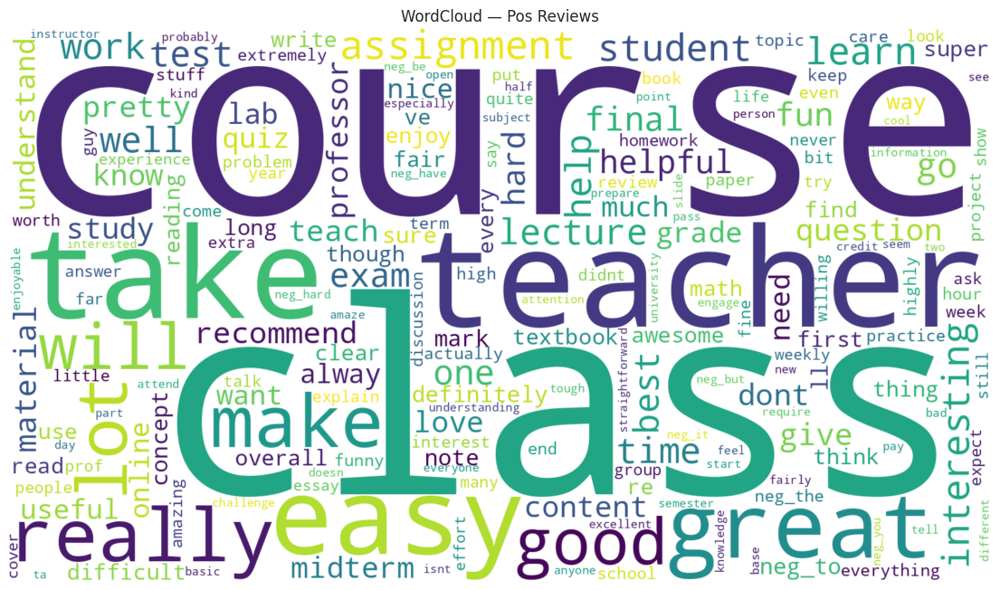

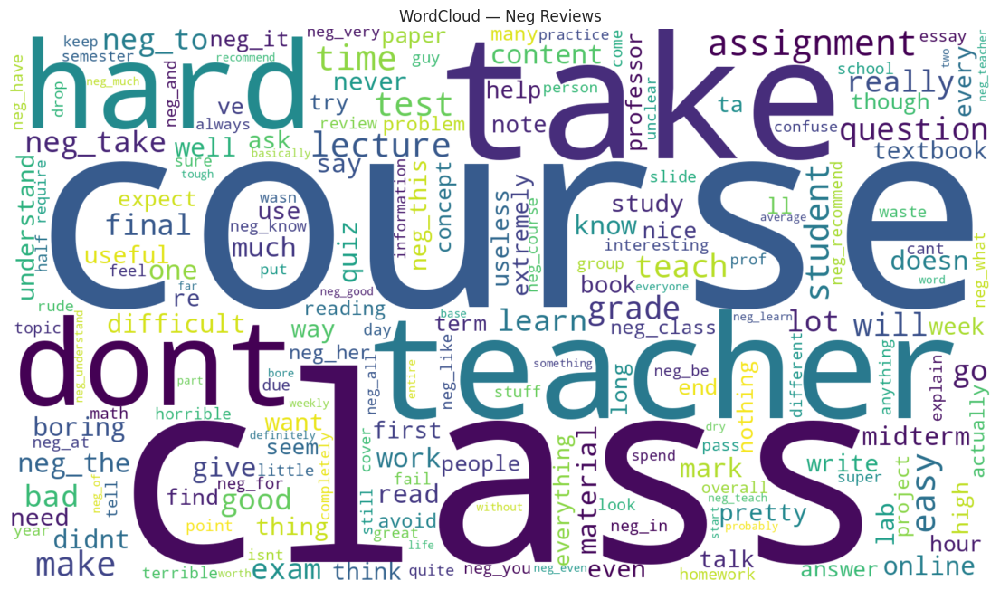

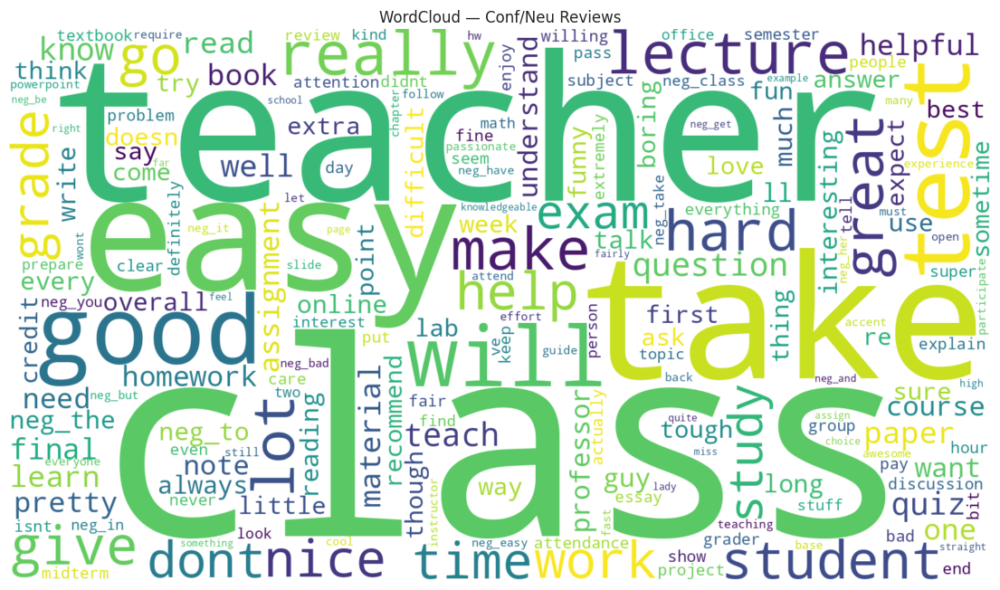

In [21]:
# Label-wise WC
for lab in ["Pos", "Neg", "Conf/Neu"]:
    subset_text = " ".join(df[df["rating_cat"] == lab]["text_clean"])
    wc = WordCloud(width=1600, height=900,
                   background_color="white",
                   max_words=200, collocations=False).generate(subset_text)
    plt.figure(figsize=(14,8))
    plt.imshow(wc, interpolation="bilinear")
    plt.axis("off")
    plt.title(f"WordCloud — {lab} Reviews")
    plt.show()


## 5. Outlier check (very long reviews)

99th percentile of cleaned length: 146.0
Number of very-long outlier reviews: 330


,dataset,entity_type,rating_cat,clean_len,review_text
19141,waterloo,course,Pos,156,"I really enjoyed this course online, being co-..."
19142,waterloo,course,Neg,168,math student who took this course since I had ...
19147,waterloo,course,Pos,176,I took this course online due to the COVID-19 ...
19152,waterloo,course,Pos,147,Nice course that teaches you how to write simp...
19250,waterloo,course,Neg,489,In the beginning of the term this course felt ...


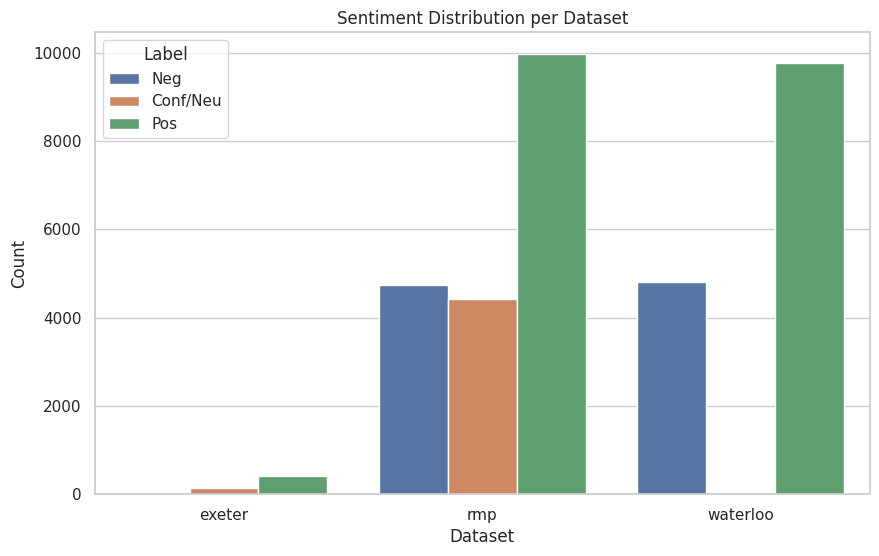

In [27]:
#  Outlier Check: Very Long Reviews (99th Percentile)
q99 = final_cleaned_unified["clean_len"].quantile(0.99)

print("99th percentile of cleaned length:", q99)

# Detect outliers
outliers = final_cleaned_unified[final_cleaned_unified["clean_len"] > q99]
print("Number of very-long outlier reviews:", len(outliers))

# Show a small preview
display(outliers[["dataset", "entity_type", "rating_cat", "clean_len", "review_text"]].head())

plt.figure(figsize=(10, 6))
sns.countplot(
    data=final_cleaned_unified,
    x="dataset",
    hue="rating_cat",
    order=sorted(final_cleaned_unified["dataset"].unique())
)
plt.title("Sentiment Distribution per Dataset")
plt.xlabel("Dataset")
plt.ylabel("Count")
plt.legend(title="Label")
plt.show()


## 6. Topic Modelling with LDA

In [46]:
# --- Topic Modelling with LDA (descriptive EDA) ---

from sklearn.feature_extraction.text import CountVectorizer, ENGLISH_STOP_WORDS
from sklearn.decomposition import LatentDirichletAllocation

# 1. Text source
texts = final_cleaned_unified["text_clean"].astype(str)

# 2. Stopwords (generic + education-specific)
domain_stopwords = {
    "class", "course", "teacher", "professor", "lecture",
    "exam", "assignment", "student", "work", "quiz",
    "midterm", "final", "mark", "grade"
}
stop_words = list(ENGLISH_STOP_WORDS.union(domain_stopwords))

# 3. Vectoriser
vectorizer = CountVectorizer(
    max_df=0.90,
    min_df=50,
    stop_words=stop_words
)
X = vectorizer.fit_transform(texts)

# 4. LDA model
n_topics = 6
lda = LatentDirichletAllocation(
    n_components=n_topics,
    learning_method="batch",
    random_state=42
)
lda.fit(X)

# 5. Display top words per topic
terms = vectorizer.get_feature_names_out()
top_n = 15

print(f"LDA fitted on {X.shape[0]} documents, {X.shape[1]} terms.")
for idx, topic in enumerate(lda.components_):
    top_indices = topic.argsort()[:-top_n-1:-1]
    top_words = [terms[i] for i in top_indices]
    print(f"\nTopic {idx+1}:")
    print(", ".join(top_words))


LDA fitted on 34267 documents, 1274 terms.

Topic 1:
content, interesting, lot, easy, useful, concept, really, pretty, learn, material, good, difficult, hard, time, practice

Topic 2:
question, test, just, answer, read, doesn, dont, ask, teach, know, book, like, time, hard, bad

Topic 3:
great, really, make, help, helpful, good, best, lot, easy, recommend, love, learn, nice, fun, test

Topic 4:
dont, neg_to, neg_the, didnt, neg_it, hard, neg_take, just, easy, lab, neg_at, neg_have, neg_in, neg_you, neg_like

Topic 5:
easy, paper, lab, time, write, reading, just, week, pretty, essay, long, online, read, group, good

Topic 6:
teach, like, learn, good, make, great, best, ve, time, bad, year, school, think, way, university


## 7. t-SNE Visualisation on TF-IDF Embeddings

/usr/local/lib/python3.12/dist-packages/sklearn/manifold/_t_sne.py:1164: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


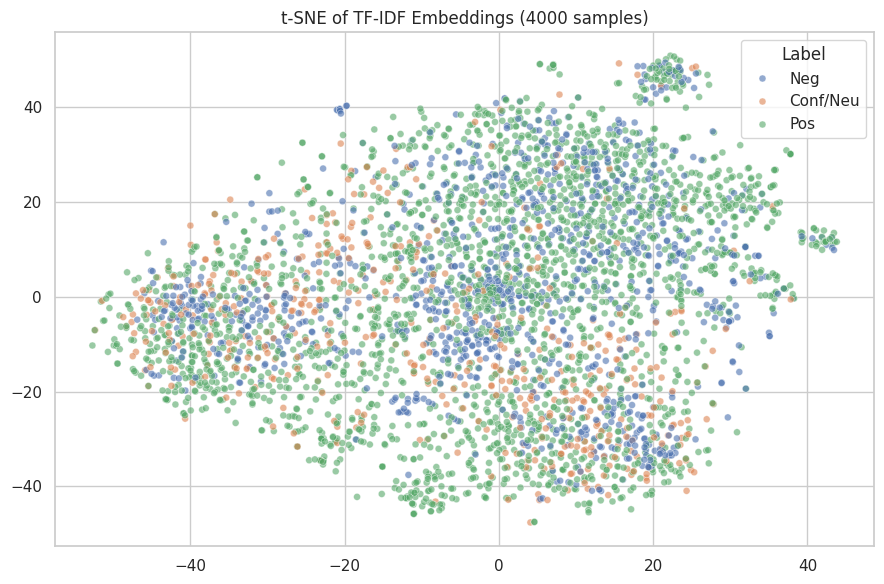

In [47]:
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.decomposition import TruncatedSVD
from sklearn.manifold import TSNE

# 1. Sample a subset (t-SNE is heavy)
sample = final_cleaned_unified.sample(4000, random_state=42)
texts = sample["text_clean"].tolist()
labels = sample["rating_cat"].tolist()

# 2. TF-IDF
tfidf = TfidfVectorizer(max_features=5000, min_df=5)
X = tfidf.fit_transform(texts)

# 3. Reduce dimensions with SVD
svd = TruncatedSVD(n_components=50, random_state=42)
X_svd = svd.fit_transform(X)

# 4. t-SNE
tsne = TSNE(
    n_components=2,
    perplexity=40,
    learning_rate="auto",
    init="random",
    random_state=42,
    n_iter=1500
)
X_tsne = tsne.fit_transform(X_svd)

sample["tsne_x"] = X_tsne[:, 0]
sample["tsne_y"] = X_tsne[:, 1]

# 5. Plot
plt.figure(figsize=(9,6))
sns.scatterplot(
    data=sample, x="tsne_x", y="tsne_y",
    hue="rating_cat",
    hue_order=["Neg", "Conf/Neu", "Pos"],
    alpha=0.6, s=25
)
plt.title("t-SNE of TF-IDF Embeddings (4000 samples)")
plt.xlabel("")
plt.ylabel("")
plt.legend(title="Label")
plt.tight_layout()
plt.show()


# **Data Preprocessing**

## Feature engineering on final_cleaned_unified → df_fe

In [12]:
df_fe = final_cleaned_unified.copy().reset_index(drop=True)

label_order = ["Neg", "Conf/Neu", "Pos"]
label2id = {lab: i for i, lab in enumerate(label_order)}
id2label = {i: lab for lab, i in label2id.items()}

df_fe = df_fe[df_fe["rating_cat"].isin(label_order)].reset_index(drop=True)
df_fe["label_id"] = df_fe["rating_cat"].map(label2id).astype(int)

df_fe["clean_len"] = df_fe["text_clean"].str.split().str.len()

def neg_ratio(text):
    toks = str(text).split()
    if not toks:
        return 0.0
    return sum(1 for t in toks if t.startswith("neg_")) / len(toks)

df_fe["neg_ratio"] = df_fe["text_clean"].apply(neg_ratio)
df_fe["exclam_count"] = df_fe["review_text_pre"].str.count("!")
df_fe["quest_count"]  = df_fe["review_text_pre"].str.count(r"\?")

df_fe = pd.get_dummies(
    df_fe,
    columns=["dataset", "entity_type"],
    drop_first=True
)

extra_feat_cols = [
    "clean_len",
    "neg_ratio",
    "exclam_count",
    "quest_count",
    "dataset_rmp",
    "dataset_waterloo",
    "entity_type_teacher",
    "entity_type_university",
]
extra_feat_cols = [c for c in extra_feat_cols if c in df_fe.columns]

print("Feature-engineering base shape:", df_fe.shape)
print("Extra numeric features:", extra_feat_cols)
print("Label mapping:", label2id)
print(df_fe["rating_cat"].value_counts())
df_fe[extra_feat_cols].describe()

Feature-engineering base shape: (34267, 36)
Extra numeric features: ['clean_len', 'neg_ratio', 'exclam_count', 'quest_count', 'dataset_rmp', 'dataset_waterloo', 'entity_type_teacher', 'entity_type_university']
Label mapping: {'Neg': 0, 'Conf/Neu': 1, 'Pos': 2}
rating_cat
Pos         20139
Neg          9557
Conf/Neu     4571
Name: count, dtype: int64


,clean_len,neg_ratio,exclam_count,quest_count
count,34267.000000,34267.000000,34267.000000,34267.000000
mean,38.003268,0.044140,0.325999,0.018969
std,29.283840,0.074920,0.724118,0.176517
min,1.000000,0.000000,0.000000,0.000000
25%,18.000000,0.000000,0.000000,0.000000
50%,35.000000,0.000000,0.000000,0.000000
75%,54.000000,0.068571,0.000000,0.000000
max,720.000000,0.750000,11.000000,9.000000


## Stratified train/val/test split (70/15/15) + class weights from train

In [13]:
y_all = df_fe["label_id"].values
indices = np.arange(len(df_fe))

train_idx, temp_idx, y_train, y_temp = train_test_split(
    indices,
    y_all,
    test_size=0.30,
    stratify=y_all,
    random_state=RANDOM_SEED,
)

val_idx, test_idx, y_val, y_test = train_test_split(
    temp_idx,
    y_temp,
    test_size=0.50,
    stratify=y_temp,
    random_state=RANDOM_SEED,
)

print("Train size:", len(train_idx))
print("Val size  :", len(val_idx))
print("Test size :", len(test_idx))

classes = np.unique(y_train)
weights = compute_class_weight(
    class_weight="balanced",
    classes=classes,
    y=y_train,
)
class_weight_dict = {int(c): float(w) for c, w in zip(classes, weights)}

print("Class weights (train only):", class_weight_dict)
print("id2label:", id2label)


Train size: 23986
Val size  : 5140
Test size : 5141
Class weights (train only): {0: 1.1951170901843549, 1: 2.499322705011983, 2: 0.5671655907876381}
id2label: {0: 'Neg', 1: 'Conf/Neu', 2: 'Pos'}


## TF-IDF

In [14]:
X_train_text = df_fe.loc[train_idx, "text_clean"].astype(str)
X_val_text   = df_fe.loc[val_idx,   "text_clean"].astype(str)
X_test_text  = df_fe.loc[test_idx,  "text_clean"].astype(str)

tfidf_vectorizer = TfidfVectorizer(
    max_features=40000,
    ngram_range=(1, 2),
    min_df=5,
    max_df=0.9,
)

X_train_tfidf = tfidf_vectorizer.fit_transform(X_train_text)
X_val_tfidf   = tfidf_vectorizer.transform(X_val_text)
X_test_tfidf  = tfidf_vectorizer.transform(X_test_text)

print("TF-IDF shapes:")
print("  Train:", X_train_tfidf.shape)
print("  Val  :", X_val_tfidf.shape)
print("  Test :", X_test_tfidf.shape)


TF-IDF shapes:
  Train: (23986, 27244)
  Val  : (5140, 27244)
  Test : (5141, 27244)


## Scale numeric features (train only) + combine with TF-IDF

In [15]:
X_meta_train = df_fe.loc[train_idx, extra_feat_cols].astype(float).values
X_meta_val   = df_fe.loc[val_idx,   extra_feat_cols].astype(float).values
X_meta_test  = df_fe.loc[test_idx,  extra_feat_cols].astype(float).values

X_meta_train = np.nan_to_num(X_meta_train, nan=0.0)
X_meta_val   = np.nan_to_num(X_meta_val,   nan=0.0)
X_meta_test  = np.nan_to_num(X_meta_test,  nan=0.0)

scaler = StandardScaler()
X_meta_train_scaled = scaler.fit_transform(X_meta_train)
X_meta_val_scaled   = scaler.transform(X_meta_val)
X_meta_test_scaled  = scaler.transform(X_meta_test)

X_meta_train_sp = csr_matrix(X_meta_train_scaled)
X_meta_val_sp   = csr_matrix(X_meta_val_scaled)
X_meta_test_sp  = csr_matrix(X_meta_test_scaled)

X_train_combined = hstack([X_train_tfidf, X_meta_train_sp])
X_val_combined   = hstack([X_val_tfidf,   X_meta_val_sp])
X_test_combined  = hstack([X_test_tfidf,  X_meta_test_sp])

print("Combined feature shapes:")
print("  Train:", X_train_combined.shape)
print("  Val  :", X_val_combined.shape)
print("  Test :", X_test_combined.shape)


Combined feature shapes:
  Train: (23986, 27252)
  Val  : (5140, 27252)
  Test : (5141, 27252)


#**Baseline Models**

##LOGISTIC REGRESSION

Fitting 5 folds for each of 3 candidates, totalling 15 fits

Best Hyperparameters: {'C': 2.0}

=== Logistic Regression (Validation) ===
              precision    recall  f1-score   support

         Neg       0.71      0.74      0.72      1433
    Conf/Neu       0.41      0.65      0.50       686
         Pos       0.85      0.72      0.78      3021

    accuracy                           0.72      5140
   macro avg       0.66      0.70      0.67      5140
weighted avg       0.75      0.72      0.73      5140


=== Logistic Regression (Test) ===
              precision    recall  f1-score   support

         Neg       0.72      0.74      0.73      1434
    Conf/Neu       0.39      0.66      0.49       686
         Pos       0.86      0.72      0.78      3021

    accuracy                           0.72      5141
   macro avg       0.66      0.71      0.67      5141
weighted avg       0.76      0.72      0.73      5141


Confusion Matrix (Test):
[[1060  173  201]
 [  84  455  147]
 [ 3

<Figure size 600x500 with 0 Axes>

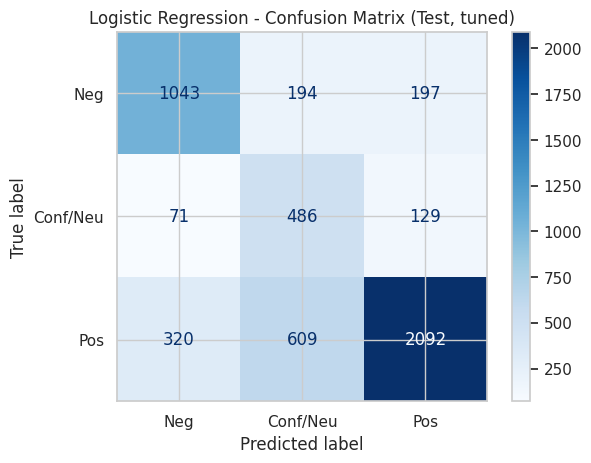

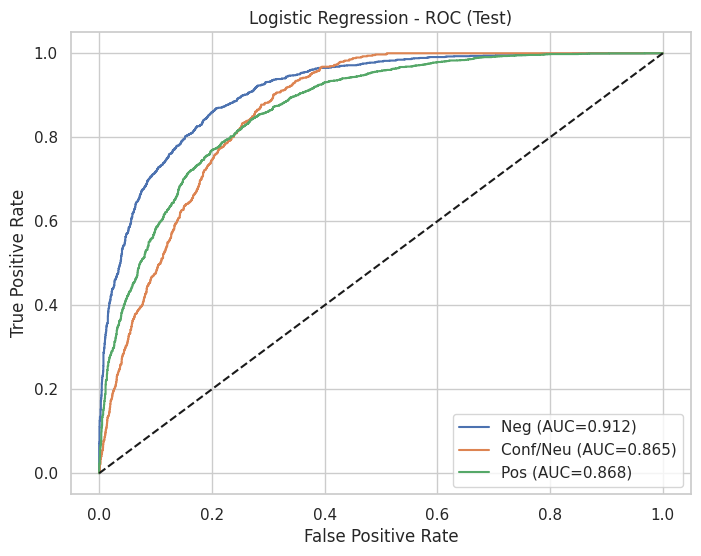


Macro ROC-AUC (Test): 0.8816833864258063


In [42]:
from sklearn.metrics import roc_auc_score, roc_curve, auc
labels = ["Neg", "Conf/Neu", "Pos"]

# 1) GridSearchCV on Logistic Regression
param_grid = {"C": [0.5, 1.0, 2.0]}

log_reg = LogisticRegression(
    max_iter=2000,
    class_weight="balanced",
    n_jobs=-1,
    solver="lbfgs"
)

grid = GridSearchCV(
    estimator=log_reg,
    param_grid=param_grid,
    scoring="f1_macro",
    cv=5,
    n_jobs=-1,
    verbose=1
)

grid.fit(X_train_combined, y_train)
best_lr = grid.best_estimator_

print("\nBest Hyperparameters:", grid.best_params_)

# 2) Validation performance
y_val_pred = best_lr.predict(X_val_combined)
print("\n=== Logistic Regression (Validation) ===")
print(classification_report(y_val, y_val_pred, target_names=labels))

# 3) Test performance
y_test_pred = best_lr.predict(X_test_combined)
print("\n=== Logistic Regression (Test) ===")
print(classification_report(y_test, y_test_pred, target_names=labels))

print("\nConfusion Matrix (Test):")
cm_test = confusion_matrix(y_test, y_test_pred)
print(cm_test)

# 4) THRESHOLD TUNING for Conf/Neu
val_probs = best_lr.predict_proba(X_val_combined)
test_probs = best_lr.predict_proba(X_test_combined)

def predict_with_alpha_probs(probs, alpha_conf):
    """Boost Conf/Neu probability by alpha_conf and renormalise."""
    p = probs.copy()
    p[:, 1] = p[:, 1] * alpha_conf
    p = p / p.sum(axis=1, keepdims=True)
    return np.argmax(p, axis=1)

alphas = [1.0, 1.2, 1.4, 1.6, 2.0]
best_macro, best_alpha = -1, 1.0

for a in alphas:
    y_val_adj = predict_with_alpha_probs(val_probs, a)
    y_val_onehot_pred = np.eye(3)[y_val_adj]
    macro = roc_auc_score(y_val, y_val_onehot_pred, multi_class="ovr", average="macro")
    print(f"alpha={a:.1f} → macro score (approx): {macro:.4f}")
    if macro > best_macro:
        best_macro = macro
        best_alpha = a

print("\nBest alpha:", best_alpha, " | Best macro (approx):", best_macro)

y_val_final = predict_with_alpha_probs(val_probs, best_alpha)
y_test_final = predict_with_alpha_probs(test_probs, best_alpha)

print("\n=== Logistic Regression (Validation, tuned threshold) ===")
print(classification_report(y_val, y_val_final, target_names=labels))

print("\n=== Logistic Regression (Test, tuned threshold) ===")
print(classification_report(y_test, y_test_final, target_names=labels))

# 5) Plot Confusion Matrix
plt.figure(figsize=(6, 5))
disp = ConfusionMatrixDisplay(confusion_matrix(y_test, y_test_final), display_labels=labels)
disp.plot(cmap="Blues", values_format="d")
plt.title("Logistic Regression - Confusion Matrix (Test, tuned)")
plt.show()

# 6) ROC curves
y_test_bin = np.eye(3)[y_test]
y_test_prob = best_lr.predict_proba(X_test_combined)

plt.figure(figsize=(8, 6))
for i in range(3):
    fpr, tpr, _ = roc_curve(y_test_bin[:, i], y_test_prob[:, i])
    roc_auc = auc(fpr, tpr)
    plt.plot(fpr, tpr, label=f"{labels[i]} (AUC={roc_auc:.3f})")

plt.plot([0, 1], [0, 1], "k--")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("Logistic Regression - ROC (Test)")
plt.legend()
plt.grid(True)
plt.show()

macro_auc = roc_auc_score(y_test_bin, y_test_prob, average="macro")
print("\nMacro ROC-AUC (Test):", macro_auc)


In [43]:
# REAL-TIME PREDICTIONS + RISK
import numpy as np
from scipy.sparse import hstack, csr_matrix

label_names = ["Neg", "Conf/Neu", "Pos"]

example_texts = [
    "The lectures are poorly structured and I rarely understand the topics. Overall, this module feels frustrating.",
    "Some weeks are clear, some are confusing. Overall it's okay but I am not fully confident.",
    "The lecturer is amazing, explains everything clearly and the module is very engaging."
]

risk_map = {
    "Neg": "High Risk",
    "Conf/Neu": "Medium Risk",
    "Pos": "Low Risk"
}

def make_combined_from_text_lr(texts):
    """TF-IDF + zero-padded extra features to match best_lr.n_features_in_"""
    X_tfidf = tfidf_vectorizer.transform(texts)
    n_model = best_lr.n_features_in_
    n_tfidf = X_tfidf.shape[1]
    n_extra = n_model - n_tfidf
    if n_extra < 0:
        raise ValueError(f"TF-IDF has {n_tfidf} features, model expects {n_model}.")
    extra = csr_matrix((X_tfidf.shape[0], n_extra))
    return hstack([X_tfidf, extra])

# TF-IDF → combined → LogReg
X_example_lr   = make_combined_from_text_lr(example_texts)
example_probs_lr = best_lr.predict_proba(X_example_lr)
example_pred_lr  = np.argmax(example_probs_lr, axis=1)

print(" REAL-TIME PREDICTIONS - Logistic Regression")
for text, idx, prob in zip(example_texts, example_pred_lr, example_probs_lr):
    label = label_names[idx]
    risk  = risk_map[label]
    print("\nText:", text)
    print("Predicted label:", label)
    print("Risk Level:", risk)
    print("Class probabilities [Neg, Conf/Neu, Pos]:", np.round(prob, 3))


 REAL-TIME PREDICTIONS - Logistic Regression

Text: The lectures are poorly structured and I rarely understand the topics. Overall, this module feels frustrating.
Predicted label: Neg
Risk Level: High Risk
Class probabilities [Neg, Conf/Neu, Pos]: [0.808 0.006 0.186]

Text: Some weeks are clear, some are confusing. Overall it's okay but I am not fully confident.
Predicted label: Neg
Risk Level: High Risk
Class probabilities [Neg, Conf/Neu, Pos]: [0.572 0.029 0.399]

Text: The lecturer is amazing, explains everything clearly and the module is very engaging.
Predicted label: Pos
Risk Level: Low Risk
Class probabilities [Neg, Conf/Neu, Pos]: [0.057 0.002 0.941]


### Logistic Regression Coefficients & Odds Ratios

In [46]:

feature_names_tfidf = tfidf_vectorizer.get_feature_names_out()
n_model = best_lr.n_features_in_
n_tfidf = len(feature_names_tfidf)

if n_model > n_tfidf:
    extra_names = np.array([f"EXTRA_FEAT_{i+1}" for i in range(n_model - n_tfidf)])
    feature_names = np.concatenate([feature_names_tfidf, extra_names])
else:
    feature_names = feature_names_tfidf[:n_model]

coefs = best_lr.coef_
coef_df_list = []
for i, class_name in enumerate(labels):
    tmp = pd.DataFrame({
        "feature": feature_names,
        "coef": coefs[i],
        "odds_ratio": np.exp(coefs[i]),
        "class": class_name
    })
    coef_df_list.append(tmp)

coef_df = pd.concat(coef_df_list, ignore_index=True)

for class_name in labels:
    print("="*60)
    print(f"CLASS: {class_name}")

    df_sub = coef_df[coef_df["class"] == class_name]

    print("\nTop 10 POSITIVE features:")
    display(df_sub.sort_values("coef", ascending=False).head(10)[["feature","coef","odds_ratio"]])

    print("\nTop 10 NEGATIVE features:")
    display(df_sub.sort_values("coef", ascending=True).head(10)[["feature","coef","odds_ratio"]])


CLASS: Neg

Top 10 POSITIVE features:


,feature,coef,odds_ratio
2199,avoid,4.436259,84.458386
22526,terrible,4.193259,66.238301
25174,useless,3.963289,52.630120
2283,bad,3.868429,47.867117
10619,horrible,3.765833,43.199684
3504,boring,3.652584,38.574230
2245,awful,3.559803,35.156269
20007,rude,3.537462,34.379554
6213,doesn,3.532806,34.219859
22957,the bad,3.155144,23.456407



Top 10 NEGATIVE features:


,feature,coef,odds_ratio
9228,great,-6.364021,0.001722
8525,fun,-4.892361,0.007504
11382,interesting,-4.072789,0.017030
12953,love,-3.526093,0.029420
2224,awesome,-3.447800,0.031816
8960,good,-3.330515,0.035775
10085,helpful,-3.282619,0.037530
11354,interest,-3.199970,0.040763
9302,great teacher,-3.091470,0.045435
5086,cool,-3.084011,0.045775


CLASS: Conf/Neu

Top 10 POSITIVE features:


,feature,coef,odds_ratio
30904,but,3.236487,25.444171
37949,however,2.144035,8.533801
48390,sometimes,2.089787,8.083190
36212,good,2.083619,8.033493
45129,overall,1.980659,7.247514
50079,that he,1.778033,5.918203
47779,she not,1.745565,5.729139
47857,shes,1.739930,5.696947
51121,though,1.725766,5.616820
35777,fun,1.696281,5.453627



Top 10 NEGATIVE features:


,feature,coef,odds_ratio
29451,avoid,-2.135654,0.118167
36877,have ever,-2.069988,0.126187
28938,anything,-2.063202,0.127047
53420,will not,-1.916247,0.147158
49778,terrible,-1.877763,0.152932
42885,neg_take,-1.841201,0.158627
53661,without,-1.831915,0.160107
31292,cant,-1.819918,0.162039
33825,easy but,-1.769363,0.170441
52626,very little,-1.698925,0.182880


CLASS: Pos

Top 10 POSITIVE features:


,feature,coef,odds_ratio
63732,great,4.712128,111.288701
57742,best,4.428184,83.779101
56728,awesome,3.638318,38.027819
67457,love,3.434452,31.014401
64589,helpful,3.391213,29.701962
61879,excellent,3.351608,28.548592
65886,interesting,3.340472,28.232460
55227,amaze,3.229160,25.258428
63029,fun,3.196080,24.436546
57779,best teacher,3.148437,23.299627



Top 10 NEGATIVE features:


,feature,coef,odds_ratio
58008,boring,-3.707604,0.024536
56787,bad,-3.121160,0.044106
60930,dry,-2.812292,0.060067
65201,however,-2.793834,0.061186
57995,bore,-2.786401,0.061643
65123,horrible,-2.759523,0.063322
79678,useless,-2.553276,0.077826
60717,doesn,-2.534740,0.079282
80087,waste,-2.531057,0.079575
59455,confusing,-2.459772,0.085454


### Logistic Regression LIME

────────────────────────────────────────
Example #10

TEXT:
think that be not neg_go neg_to neg_like this course at all and that it be go to be dry it be not neg_at neg_all this course be an incredibly important and amazing course which touch on the philosophy of compute elaborate on material learn in and provide concrete and interesting proof and argument towards many well known conclusion such the halting problem the final grade receive in this course be felt that all of the assignment and exam minus the final assignment which felt be unfair be fair though challenging and that my relatively poor performance be entirely my own highly recommend take this course with teacher if you be give the opportunity

Labels:
  True label : Pos
  Pred label : Pos

Class probabilities:
  Neg      : 0.306
  Conf/Neu : 0.003
  Pos      : 0.691

LIME explanation visualised for label: Conf/Neu


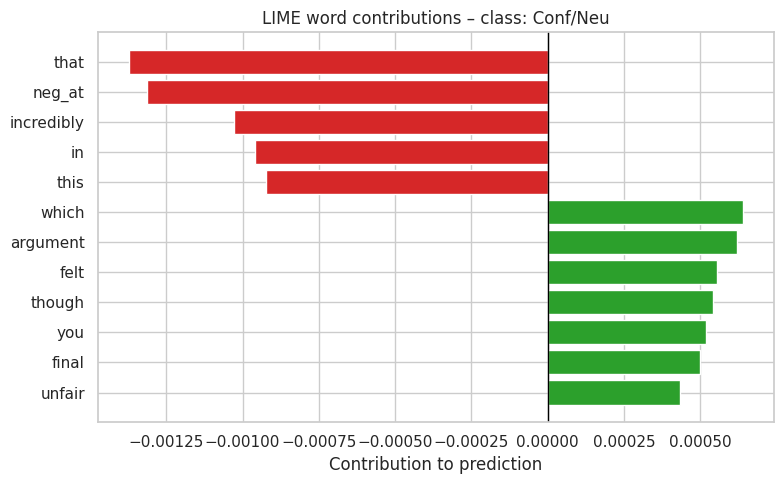

In [62]:
import numpy as np
import matplotlib.pyplot as plt
from IPython.display import HTML, display

def explain_with_lime_pretty(example_idx=10):
    #  1. Pick example
    text_example = X_val_text.iloc[example_idx]
    true_label_idx = y_val[example_idx]
    true_label = labels[true_label_idx]

    #  2. Get LIME explanation
    exp = explainer.explain_instance(
        text_example,
        predict_proba_lime,
        num_features=12
    )

    probs = exp.predict_proba
    pred_idx = int(np.argmax(probs))
    pred_label = labels[pred_idx]

    available_labels = sorted(exp.local_exp.keys())
    if pred_idx in exp.local_exp:
        label_for_bars = pred_idx
    else:
        label_for_bars = available_labels[0]
    label_for_bars_name = labels[label_for_bars]

    # ----- 3. Console summary -----
    print("────────────────────────────────────────")
    print(f"Example #{example_idx}")
    print("\nTEXT:")
    print(text_example)
    print("\nLabels:")
    print(f"  True label : {true_label}")
    print(f"  Pred label : {pred_label}\n")
    print("Class probabilities:")
    for i, c in enumerate(labels):
        print(f"  {c:9s}: {probs[i]:.3f}")
    print(f"\nLIME explanation visualised for label: {label_for_bars_name}")

    #  4. Bar plot of word contributions (nice + clear)
    contrib = exp.as_list(label=label_for_bars)
    words   = [w for w, _ in contrib][::-1]
    weights = [w for _, w in contrib][::-1]

    colors = ["#2ca02c" if w > 0 else "#d62728" for w in weights]

    plt.figure(figsize=(8, 5))
    plt.barh(words, weights, color=colors)
    plt.axvline(0, color="black", linewidth=1)
    plt.title(f"LIME word contributions – class: {label_for_bars_name}")
    plt.xlabel("Contribution to prediction")
    plt.tight_layout()
    plt.show()

    # 5. White-theme HTML (for screenshot in report)
    html_raw = exp.as_html()
    html_wrapped = f"""
    <div style="
        background-color:#ffffff;
        color:#000000;
        padding:16px;
        border:1px solid #dddddd;
        border-radius:8px;
        font-size:15px;
        line-height:1.5;">
        {html_raw}
    </div>
    """
    display(HTML(html_wrapped))

# Example call
explain_with_lime_pretty(example_idx=10)


##Support Vector Machine (SVM)

Fitting 3 folds for each of 1 candidates, totalling 3 fits
Best SVM hyperparameters: {'C': 1.0}

=== Linear SVM (val, tuned) ===
              precision    recall  f1-score   support

         Neg       0.71      0.71      0.71      1433
    Conf/Neu       0.39      0.37      0.38       686
         Pos       0.80      0.81      0.81      3021

    accuracy                           0.72      5140
   macro avg       0.63      0.63      0.63      5140
weighted avg       0.72      0.72      0.72      5140

=== Linear SVM (test, tuned) ===
              precision    recall  f1-score   support

         Neg       0.72      0.73      0.72      1434
    Conf/Neu       0.38      0.35      0.37       686
         Pos       0.81      0.82      0.81      3021

    accuracy                           0.73      5141
   macro avg       0.64      0.63      0.63      5141
weighted avg       0.73      0.73      0.73      5141


Confusion matrix (SVM, test):
[[1043  107  284]
 [ 134  241  311]
 [ 269  2

<Figure size 500x400 with 0 Axes>

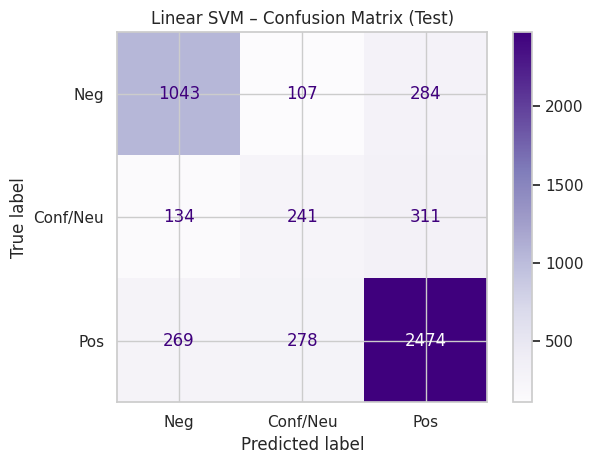

Probabilities shapes (val, test): (5140, 3) (5141, 3)


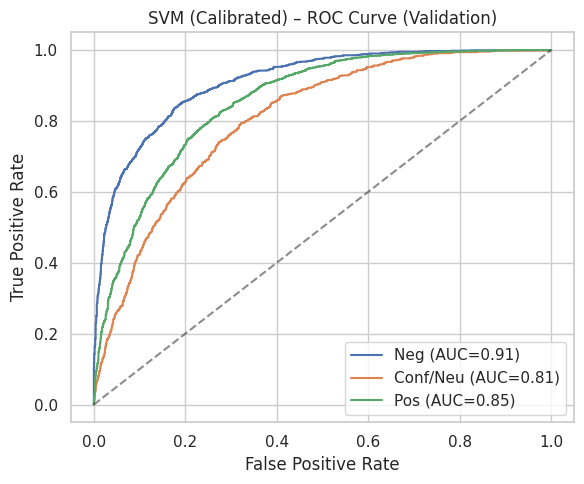

SVM (calibrated) macro AUC (val):  0.856994308095345
SVM (calibrated) macro AUC (test): 0.856928613758073


In [55]:
label_names = [id2label[i] for i in sorted(id2label.keys())]

# 1) Train Linear SVM on TF-IDF ONLY
svm_base = LinearSVC(
    class_weight=class_weight_dict,
    random_state=RANDOM_SEED,
    max_iter=3000
)
svm_param_grid = {"C": [1.0]}

svm_grid = GridSearchCV(
    estimator=svm_base,
    param_grid=svm_param_grid,
    scoring="f1_macro",
    cv=3,
    n_jobs=-1,
    verbose=1
)

svm_grid.fit(X_train_tfidf, y_train)
best_svm = svm_grid.best_estimator_

print("Best SVM hyperparameters:", svm_grid.best_params_)

# 2) Validation + Test reports
y_val_pred_svm  = best_svm.predict(X_val_tfidf)
y_test_pred_svm = best_svm.predict(X_test_tfidf)

print("\n=== Linear SVM (val, tuned) ===")
print(classification_report(y_val, y_val_pred_svm, target_names=label_names))
print("=== Linear SVM (test, tuned) ===")
print(classification_report(y_test, y_test_pred_svm, target_names=label_names))

# 3) Confusion matrix on test
cm_svm = confusion_matrix(y_test, y_test_pred_svm)
print("\nConfusion matrix (SVM, test):")
print(cm_svm)

plt.figure(figsize=(5, 4))
disp = ConfusionMatrixDisplay(confusion_matrix=cm_svm, display_labels=label_names)
disp.plot(cmap="Purples", values_format="d")
plt.title("Linear SVM – Confusion Matrix (Test)")
plt.tight_layout()
plt.show()

# 4) Calibrated probabilities + ROC curves
svm_calibrated = CalibratedClassifierCV(best_svm, method="sigmoid", cv=3)
svm_calibrated.fit(X_train_tfidf, y_train)
y_val_proba_svm  = svm_calibrated.predict_proba(X_val_tfidf)
y_test_proba_svm = svm_calibrated.predict_proba(X_test_tfidf)

print("Probabilities shapes (val, test):", y_val_proba_svm.shape, y_test_proba_svm.shape)

y_val_bin  = label_binarize(y_val,  classes=[0, 1, 2])
y_test_bin = label_binarize(y_test, classes=[0, 1, 2])
plt.figure(figsize=(6, 5))
for i, name in enumerate(label_names):
    fpr, tpr, _ = roc_curve(y_val_bin[:, i], y_val_proba_svm[:, i])
    roc_auc = auc(fpr, tpr)
    plt.plot(fpr, tpr, label=f"{name} (AUC={roc_auc:.2f})")

plt.plot([0, 1], [0, 1], "k--", alpha=0.5)
plt.title("SVM (Calibrated) – ROC Curve (Validation)")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.legend()
plt.tight_layout()
plt.show()

# Macro AUC
svm_macro_auc_val  = roc_auc_score(y_val_bin,  y_val_proba_svm,  average="macro")
svm_macro_auc_test = roc_auc_score(y_test_bin, y_test_proba_svm, average="macro")
print("SVM (calibrated) macro AUC (val): ", svm_macro_auc_val)
print("SVM (calibrated) macro AUC (test):", svm_macro_auc_test)

In [56]:
# REAL-TIME PREDICTIONS + RISK
example_texts = [
    "The lectures are poorly structured and I rarely understand the topics. Overall, this module feels frustrating.",
    "Some weeks are clear, some are confusing. Overall it's okay but I am not fully confident.",
    "The lecturer is amazing, explains everything clearly and the module is very engaging."
]

risk_map = {
    "Neg": "High Risk",
    "Conf/Neu": "Medium Risk",
    "Pos": "Low Risk"
}

# TF-IDF → Calibrated SVM
X_example_svm = tfidf_vectorizer.transform(example_texts)
example_probs_svm = svm_calibrated.predict_proba(X_example_svm)
example_pred_svm = np.argmax(example_probs_svm, axis=1)

print("=== REAL-TIME PREDICTIONS (Linear SVM – Calibrated) ===")
for text, idx, prob in zip(example_texts, example_pred_svm, example_probs_svm):
    label = label_names[idx]
    risk  = risk_map[label]
    print("\nText:", text)
    print("Predicted label:", label)
    print("Risk Level:", risk)
    print("Class probabilities [Neg, Conf/Neu, Pos]:", np.round(prob, 3))


=== REAL-TIME PREDICTIONS (Linear SVM – Calibrated) ===

Text: The lectures are poorly structured and I rarely understand the topics. Overall, this module feels frustrating.
Predicted label: Neg
Risk Level: High Risk
Class probabilities [Neg, Conf/Neu, Pos]: [0.676 0.104 0.22 ]

Text: Some weeks are clear, some are confusing. Overall it's okay but I am not fully confident.
Predicted label: Pos
Risk Level: Low Risk
Class probabilities [Neg, Conf/Neu, Pos]: [0.356 0.187 0.457]

Text: The lecturer is amazing, explains everything clearly and the module is very engaging.
Predicted label: Pos
Risk Level: Low Risk
Class probabilities [Neg, Conf/Neu, Pos]: [0.032 0.08  0.888]


In [68]:
# XAI — Global Feature Importance for Linear SVM

feature_names = tfidf_vectorizer.get_feature_names_out()
coef = best_svm.coef_

def top_features_for_class(class_idx, k=15):
    class_name = label_names[class_idx]
    w = coef[class_idx]

    # Top positive (push toward the class)
    pos_idx = np.argsort(w)[-k:][::-1]
    pos = pd.DataFrame({
        "feature": feature_names[pos_idx],
        "coef": w[pos_idx],
        "odds_ratio": np.exp(w[pos_idx]),
        "class": class_name
    })

    # Top negative (push away from the class)
    neg_idx = np.argsort(w)[:k]
    neg = pd.DataFrame({
        "feature": feature_names[neg_idx],
        "coef": w[neg_idx],
        "odds_ratio": np.exp(w[neg_idx]),
        "class": class_name
    })

    return pos, neg

# Print for all classes
for idx, name in enumerate(label_names):
    print("="*70)
    print(f"CLASS: {name}")
    pos, neg = top_features_for_class(idx)

    print("\nTop 15 POSITIVE features:\n")
    display(pos)

    print("\nTop 15 NEGATIVE features:\n")
    display(neg)


CLASS: Neg

Top 15 POSITIVE features:



,feature,coef,odds_ratio,class
0,boring,2.874155,17.710455,Neg
1,terrible,2.765303,15.883853,Neg
2,useless,2.704927,14.953225,Neg
3,awful,2.696798,14.832158,Neg
4,horrible,2.631171,13.890023,Neg
5,avoid,2.612822,13.637480,Neg
6,rude,2.305245,10.026637,Neg
7,bad,2.300059,9.974773,Neg
8,confusing,2.234168,9.338707,Neg
9,disorganized,2.200643,9.030814,Neg



Top 15 NEGATIVE features:



,feature,coef,odds_ratio,class
0,great,-3.970473,0.018865,Neg
1,fun,-3.198206,0.040835,Neg
2,interesting,-3.025230,0.048547,Neg
3,awesome,-2.591675,0.074894,Neg
4,love,-2.506326,0.081567,Neg
5,amazing,-2.499019,0.082166,Neg
6,enjoyable,-2.307879,0.099472,Neg
7,great teacher,-2.265857,0.103741,Neg
8,good,-2.261911,0.104151,Neg
9,interest,-2.169559,0.114228,Neg


CLASS: Conf/Neu

Top 15 POSITIVE features:



,feature,coef,odds_ratio,class
0,but,2.525091,12.492026,Conf/Neu
1,question we,2.432251,11.384483,Conf/Neu
2,discussion question,2.405425,11.083144,Conf/Neu
3,course she,2.315365,10.128615,Conf/Neu
4,me learn,2.166681,8.729264,Conf/Neu
5,dress,2.086301,8.055066,Conf/Neu
6,learn with,2.061907,7.860945,Conf/Neu
7,however,2.059761,7.844094,Conf/Neu
8,university have,2.020743,7.543930,Conf/Neu
9,he seem,2.019636,7.535585,Conf/Neu



Top 15 NEGATIVE features:



,feature,coef,odds_ratio,class
0,course,-3.011242,0.049230,Conf/Neu
1,useful,-2.724989,0.065547,Conf/Neu
2,teach he,-2.066868,0.126582,Conf/Neu
3,really didnt,-2.039497,0.130094,Conf/Neu
4,concept,-2.031945,0.131080,Conf/Neu
5,term,-2.005628,0.134576,Conf/Neu
6,have ever,-1.889663,0.151123,Conf/Neu
7,be amazing,-1.871278,0.153927,Conf/Neu
8,she even,-1.829407,0.160509,Conf/Neu
9,content,-1.818773,0.162225,Conf/Neu


CLASS: Pos

Top 15 POSITIVE features:



,feature,coef,odds_ratio,class
0,interesting,2.781585,16.144597,Pos
1,best,2.444647,11.526476,Pos
2,amaze,2.347777,10.462285,Pos
3,best teacher,2.209643,9.112464,Pos
4,fun course,2.159662,8.668208,Pos
5,excellent,2.073618,7.953547,Pos
6,awesome,2.061776,7.859916,Pos
7,great,1.960959,7.106138,Pos
8,fantastic,1.862673,6.440933,Pos
9,love,1.853960,6.385057,Pos



Top 15 NEGATIVE features:



,feature,coef,odds_ratio,class
0,boring,-2.701741,0.067089,Pos
1,bad,-2.299038,0.100355,Pos
2,confusing,-2.285035,0.101770,Pos
3,horrible,-2.261395,0.104205,Pos
4,waste,-2.161468,0.115156,Pos
5,avoid,-2.157088,0.115661,Pos
6,useless,-2.079534,0.124988,Pos
7,confuse,-2.013396,0.133534,Pos
8,waste of,-2.000377,0.135284,Pos
9,bore,-1.993921,0.136160,Pos


───────────────────────────────────────────────────────
Example #10

TEXT:
 think that be not neg_go neg_to neg_like this course at all and that it be go to be dry it be not neg_at neg_all this course be an incredibly important and amazing course which touch on the philosophy of compute elaborate on material learn in and provide concrete and interesting proof and argument towards many well known conclusion such the halting problem the final grade receive in this course be felt that all of the assignment and exam minus the final assignment which felt be unfair be fair th 

Labels:
  True : Pos
  Pred : Pos

Class probabilities:
  Neg     : 0.245
  Conf/Neu: 0.012
  Pos     : 0.743


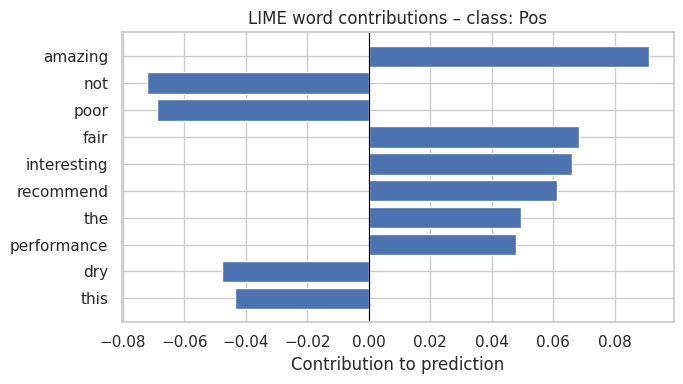


Real-time predictions with risk levels (Linear SVM)

Text: The lectures are poorly structured and I rarely understand the topics. Overall, this module feels frustrating.
Predicted label : Neg
Risk level      : High Risk
Probabilities   : Neg=0.676, Conf/Neu=0.104, Pos=0.220

Text: Some weeks are clear, some are confusing, overall it's okay but I am not fully confident.
Predicted label : Pos
Risk level      : Low Risk
Probabilities   : Neg=0.356, Conf/Neu=0.187, Pos=0.457

Text: The lecturer is amazing, explains everything clearly and the module is very engaging.
Predicted label : Pos
Risk level      : Low Risk
Probabilities   : Neg=0.032, Conf/Neu=0.080, Pos=0.888


In [71]:
# XAI – LIME + Risk Levels for Linear SVM
from lime.lime_text import LimeTextExplainer
import matplotlib.pyplot as plt
import numpy as np

# 1) LIME setup
def predict_proba_lime(texts):
    X = tfidf_vectorizer.transform(texts)
    return svm_calibrated.predict_proba(X)

explainer_svm = LimeTextExplainer(class_names=label_names)

def explain_with_lime_svm(example_idx=10):
    text_example = X_val_text.iloc[example_idx]
    true_label  = label_names[int(y_val[example_idx])]
    probs       = predict_proba_lime([text_example])[0]
    pred_idx    = int(np.argmax(probs))
    pred_label  = label_names[pred_idx]

    print("─" * 55)
    print(f"Example #{example_idx}")
    print("\nTEXT:\n", text_example[:500], "\n")
    print("Labels:")
    print(f"  True : {true_label}")
    print(f"  Pred : {pred_label}\n")
    print("Class probabilities:")
    for name, p in zip(label_names, probs):
        print(f"  {name:<8}: {p:.3f}")

    # LIME explanation for predicted class only
    exp = explainer_svm.explain_instance(
        text_example,
        predict_proba_lime,
        num_features=10,
        labels=[pred_idx]
    )

    contrib = exp.as_list(label=pred_idx)
    words   = [w for w, _ in contrib][::-1]
    weights = [w for _, w in contrib][::-1]

    # White, clean bar plot
    plt.figure(figsize=(7, 4), facecolor="white")
    plt.barh(words, weights)
    plt.axvline(0, color="black", linewidth=0.8)
    plt.xlabel("Contribution to prediction")
    plt.title(f"LIME word contributions – class: {pred_label}")
    plt.tight_layout()
    plt.show()

    return exp


# Running LIME on one validation example
exp_svm = explain_with_lime_svm(example_idx=10)


# 2) Real-time predictions + risk levels
example_texts = [
    "The lectures are poorly structured and I rarely understand the topics. Overall, this module feels frustrating.",
    "Some weeks are clear, some are confusing, overall it's okay but I am not fully confident.",
    "The lecturer is amazing, explains everything clearly and the module is very engaging."
]

risk_map = {
    "Neg": "High Risk",
    "Conf/Neu": "Medium Risk",
    "Pos": "Low Risk"
}

X_example      = tfidf_vectorizer.transform(example_texts)
example_probs  = svm_calibrated.predict_proba(X_example)
example_labels = np.argmax(example_probs, axis=1)

print("\n" + "=" * 65)
print("Real-time predictions with risk levels (Linear SVM)")
print("=" * 65)

for text, idx, prob in zip(example_texts, example_labels, example_probs):
    label = label_names[int(idx)]
    risk  = risk_map[label]
    print("\nText:", text)
    print("Predicted label :", label)
    print("Risk level      :", risk)
    print("Probabilities   :",
          ", ".join(f"{name}={p:.3f}" for name, p in zip(label_names, prob)))


#**DEEP LEARNING SETUP**

## ANN

In [73]:
# ANN – SVD features + training
import numpy as np
import tensorflow as tf
from tensorflow.keras import layers, models
from sklearn.decomposition import TruncatedSVD

RANDOM_SEED = 42
np.random.seed(RANDOM_SEED)
tf.random.set_seed(RANDOM_SEED)

# 1) Reduce TF-IDF dimensionality for ANN
n_components = 300
svd_ann = TruncatedSVD(
    n_components=n_components,
    random_state=RANDOM_SEED
)

X_train_ann = svd_ann.fit_transform(X_train_tfidf)
X_val_ann   = svd_ann.transform(X_val_tfidf)
X_test_ann  = svd_ann.transform(X_test_tfidf)

print("SVD shapes:")
print("  Train:", X_train_ann.shape)
print("  Val  :", X_val_ann.shape)
print("  Test :", X_test_ann.shape)

num_features = n_components
num_classes  = 3

# 2) Build a compact ANN
ann_model = models.Sequential([
    layers.Input(shape=(num_features,)),
    layers.Dense(256, activation='relu'),
    layers.Dropout(0.3),
    layers.Dense(128, activation='relu'),
    layers.Dropout(0.2),
    layers.Dense(num_classes, activation='softmax')
])

ann_model.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=1e-3),
    loss="sparse_categorical_crossentropy",
    metrics=["accuracy"]
)

ann_model.summary()

# 3) Train
callback = tf.keras.callbacks.EarlyStopping(
    monitor='val_loss',
    patience=1,
    restore_best_weights=True
)

history_ann = ann_model.fit(
    X_train_ann, y_train,
    validation_data=(X_val_ann, y_val),
    epochs=6,
    batch_size=256,
    callbacks=[callback],
    verbose=1
)

SVD shapes:
  Train: (23986, 300)
  Val  : (5140, 300)
  Test : (5141, 300)


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense (Dense)                   │ (None, 256)            │        77,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 128)            │        32,896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 3)              │           387 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 110,339 (431.01 KB)

 Trainable params: 110,339 (431.01 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/6
94/94 ━━━━━━━━━━━━━━━━━━━━ 5s 26ms/step - accuracy: 0.5758 - loss: 0.9468 - val_accuracy: 0.7274 - val_loss: 0.6665
Epoch 2/6
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.7357 - loss: 0.6375 - val_accuracy: 0.7383 - val_loss: 0.6138
Epoch 3/6
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.7532 - loss: 0.5910 - val_accuracy: 0.7434 - val_loss: 0.6043
Epoch 4/6
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.7613 - loss: 0.5692 - val_accuracy: 0.7482 - val_loss: 0.5994
Epoch 5/6
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.7711 - loss: 0.5494 - val_accuracy: 0.7449 - val_loss: 0.5959
Epoch 6/6
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.7758 - loss: 0.5357 - val_accuracy: 0.7475 - val_loss: 0.5946


161/161 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step
161/161 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
=== ANN (Validation) ===
              precision    recall  f1-score   support

         Neg       0.72      0.69      0.70      1433
    Conf/Neu       0.54      0.24      0.33       686
         Pos       0.78      0.89      0.83      3021

    accuracy                           0.75      5140
   macro avg       0.68      0.61      0.62      5140
weighted avg       0.73      0.75      0.73      5140


=== ANN (Test) ===
              precision    recall  f1-score   support

         Neg       0.74      0.69      0.71      1434
    Conf/Neu       0.50      0.23      0.32       686
         Pos       0.78      0.89      0.83      3021

    accuracy                           0.75      5141
   macro avg       0.67      0.61      0.62      5141
weighted avg       0.73      0.75      0.73      5141


Confusion matrix (ANN, Test):
[[ 991   69  374]
 [ 118  159  409]
 [ 230   91 2700]]


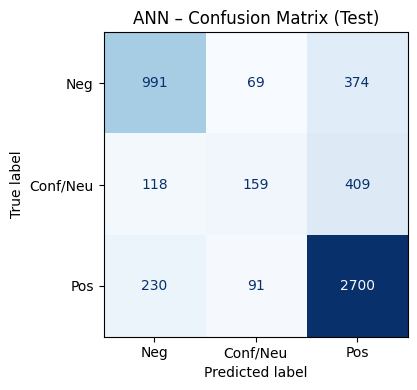

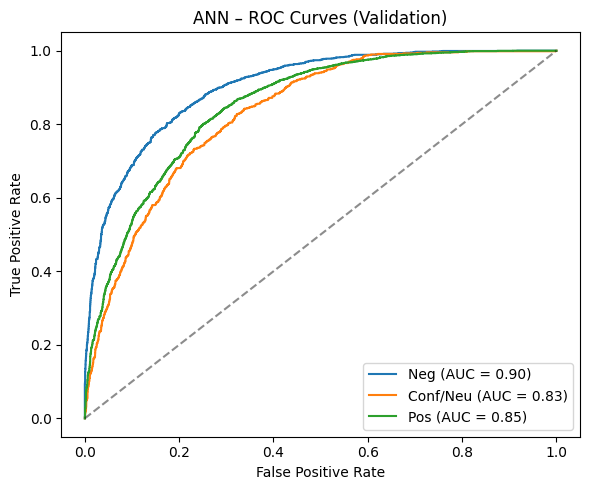

ANN macro AUC (val):  0.862
ANN macro AUC (test): 0.864


In [74]:
#  ANN EVALUATION
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import (
    classification_report,
    confusion_matrix,
    ConfusionMatrixDisplay,
    roc_curve, auc, roc_auc_score
)
from sklearn.preprocessing import label_binarize

plt.style.use("default")
label_names = ["Neg", "Conf/Neu", "Pos"]

# 1) Predictions (val + test)
y_val_proba_ann  = ann_model.predict(X_val_ann)
y_test_proba_ann = ann_model.predict(X_test_ann)

y_val_pred_ann  = np.argmax(y_val_proba_ann, axis=1)
y_test_pred_ann = np.argmax(y_test_proba_ann, axis=1)

print("=== ANN (Validation) ===")
print(classification_report(y_val, y_val_pred_ann, target_names=label_names))

print("\n=== ANN (Test) ===")
print(classification_report(y_test, y_test_pred_ann, target_names=label_names))

# 2) Confusion matrix (Test)
cm_ann = confusion_matrix(y_test, y_test_pred_ann)
print("\nConfusion matrix (ANN, Test):")
print(cm_ann)

fig, ax = plt.subplots(figsize=(5, 4))
disp = ConfusionMatrixDisplay(confusion_matrix=cm_ann, display_labels=label_names)
disp.plot(cmap="Blues", values_format="d", ax=ax, colorbar=False)
ax.set_title("ANN – Confusion Matrix (Test)")
plt.tight_layout()
plt.show()

# 3) ROC curves (Validation, macro AUC)
y_val_bin  = label_binarize(y_val,  classes=[0, 1, 2])
y_test_bin = label_binarize(y_test, classes=[0, 1, 2])

plt.figure(figsize=(6, 5))
for i, name in enumerate(label_names):
    fpr, tpr, _ = roc_curve(y_val_bin[:, i], y_val_proba_ann[:, i])
    roc_auc = auc(fpr, tpr)
    plt.plot(fpr, tpr, label=f"{name} (AUC = {roc_auc:.2f})")

plt.plot([0, 1], [0, 1], "k--", alpha=0.5)
plt.title("ANN – ROC Curves (Validation)")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.legend()
plt.tight_layout()
plt.show()

ann_macro_auc_val  = roc_auc_score(y_val_bin,  y_val_proba_ann,  average="macro")
ann_macro_auc_test = roc_auc_score(y_test_bin, y_test_proba_ann, average="macro")
print(f"ANN macro AUC (val):  {ann_macro_auc_val:.3f}")
print(f"ANN macro AUC (test): {ann_macro_auc_test:.3f}")


In [38]:
# ANN – REAL-TIME PREDICTIONS + RISK LEVEL
import numpy as np

label_names = ["Neg", "Conf/Neu", "Pos"]

risk_map = {
    "Neg": "High Risk",
    "Conf/Neu": "Medium Risk",
    "Pos": "Low Risk",
}
example_texts = [
    "The lectures are poorly structured and I rarely understand the topics. Overall, this module feels frustrating.",
    "Some weeks are clear, some are confusing, overall it's okay but I am not fully confident.",
    "The lecturer is amazing, explains everything clearly and the module is very engaging."
]

def basic_clean(t):
    return t.lower().strip()

# 1) Text → TF-IDF → SVD features
example_clean = [basic_clean(t) for t in example_texts]
X_ex_tfidf = tfidf_vectorizer.transform(example_clean)
X_ex_ann   = svd_ann.transform(X_ex_tfidf)

# 2) ANN probabilities + predicted labels
probs_ann = ann_model.predict(X_ex_ann)
pred_idx  = np.argmax(probs_ann, axis=1)

print("\n REAL-TIME PREDICTIONS WITH RISK LEVEL (ANN)")
for text, idx, p in zip(example_texts, pred_idx, probs_ann):
    label = label_names[idx]
    risk  = risk_map[label]
    print("\nText:", text)
    print("Predicted label:", label)
    print("Risk Level:", risk)
    print("Class probabilities [Neg, Conf/Neu, Pos]:", np.round(p, 3))


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step

 REAL-TIME PREDICTIONS WITH RISK LEVEL (ANN)

Text: The lectures are poorly structured and I rarely understand the topics. Overall, this module feels frustrating.
Predicted label: Neg
Risk Level: High Risk
Class probabilities [Neg, Conf/Neu, Pos]: [0.485 0.239 0.275]

Text: Some weeks are clear, some are confusing, overall it's okay but I am not fully confident.
Predicted label: Pos
Risk Level: Low Risk
Class probabilities [Neg, Conf/Neu, Pos]: [0.191 0.254 0.555]

Text: The lecturer is amazing, explains everything clearly and the module is very engaging.
Predicted label: Pos
Risk Level: Low Risk
Class probabilities [Neg, Conf/Neu, Pos]: [0.021 0.06  0.918]


##BiLSTM

In [39]:
X_train_text = df_fe.loc[train_idx, "text_clean"].astype(str).tolist()
X_val_text   = df_fe.loc[val_idx,   "text_clean"].astype(str).tolist()
X_test_text  = df_fe.loc[test_idx,  "text_clean"].astype(str).tolist()

y_train_dl = y_train.copy()
y_val_dl   = y_val.copy()
y_test_dl  = y_test.copy()

# Tokenisation
MAX_WORDS = 30000
MAX_LEN   = 150

tokenizer = Tokenizer(num_words=MAX_WORDS, oov_token="<UNK>")
tokenizer.fit_on_texts(X_train_text)

X_train_seq = tokenizer.texts_to_sequences(X_train_text)
X_val_seq   = tokenizer.texts_to_sequences(X_val_text)
X_test_seq  = tokenizer.texts_to_sequences(X_test_text)

X_train_pad = pad_sequences(X_train_seq, maxlen=MAX_LEN, padding="post", truncating="post")
X_val_pad   = pad_sequences(X_val_seq,   maxlen=MAX_LEN, padding="post", truncating="post")
X_test_pad  = pad_sequences(X_test_seq,  maxlen=MAX_LEN, padding="post", truncating="post")

vocab_size = min(MAX_WORDS, len(tokenizer.word_index) + 1)
print("Vocab size:", vocab_size)
print("Train seq shape:", X_train_pad.shape)
print("Val seq shape  :", X_val_pad.shape)
print("Test seq shape :", X_test_pad.shape)
print("id2label:", id2label)
print("class_weight_dict:", class_weight_dict)

#  BiLSTM model

def build_bilstm_model(vocab_size, max_len, n_classes=3, emb_dim=128, lstm_units=64):
    model = models.Sequential()
    model.add(layers.Embedding(
        input_dim=vocab_size,
        output_dim=emb_dim,
        input_shape=(max_len,)
    ))
    model.add(layers.Bidirectional(layers.LSTM(lstm_units, return_sequences=True)))
    model.add(layers.GlobalMaxPooling1D())
    model.add(layers.Dense(64, activation="relu"))
    model.add(layers.Dropout(0.3))
    model.add(layers.Dense(n_classes, activation="softmax"))

    model.compile(
        loss="sparse_categorical_crossentropy",
        optimizer=tf.keras.optimizers.Adam(learning_rate=1e-3),
        metrics=["accuracy"],
    )
    return model

bilstm_model = build_bilstm_model(
    vocab_size=vocab_size,
    max_len=MAX_LEN,
    n_classes=len(label2id)
)

# building explicitly so summary shows params
bilstm_model.build(input_shape=(None, MAX_LEN))
bilstm_model.summary()

bilstm_ckpt = "bilstm_best.keras"

es = EarlyStopping(
    monitor="val_loss",
    patience=3,
    restore_best_weights=True,
    verbose=1,
)

mc = ModelCheckpoint(
    filepath=bilstm_ckpt,
    monitor="val_loss",
    save_best_only=True,
    verbose=1,
)

history_bilstm = bilstm_model.fit(
    X_train_pad,
    y_train_dl,
    validation_data=(X_val_pad, y_val_dl),
    epochs=10,
    batch_size=128,
    class_weight=class_weight_dict,
    callbacks=[es, mc],
    verbose=1,
)


Vocab size: 14872
Train seq shape: (23986, 150)
Val seq shape  : (5140, 150)
Test seq shape : (5141, 150)
id2label: {0: 'Neg', 1: 'Conf/Neu', 2: 'Pos'}
class_weight_dict: {0: 1.1951170901843549, 1: 2.499322705011983, 2: 0.5671655907876381}


/usr/local/lib/python3.12/dist-packages/keras/src/layers/core/embedding.py:100: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ embedding (Embedding)           │ (None, 150, 128)       │     1,903,616 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ bidirectional (Bidirectional)   │ (None, 150, 128)       │        98,816 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_max_pooling1d            │ (None, 128)            │             0 │
│ (GlobalMaxPooling1D)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 64)             │         8,256 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_2 (Dropout)             │ (None, 64)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4 (Dense)                 │ (None, 3)              │           195 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,010,883 (7.67 MB)

 Trainable params: 2,010,883 (7.67 MB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/10
185/188 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - accuracy: 0.4359 - loss: 1.0052
Epoch 1: val_loss improved from inf to 0.73964, saving model to bilstm_best.keras
188/188 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.4381 - loss: 1.0028 - val_accuracy: 0.6595 - val_loss: 0.7396
Epoch 2/10
187/188 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - accuracy: 0.6833 - loss: 0.6947
Epoch 2: val_loss did not improve from 0.73964
188/188 ━━━━━━━━━━━━━━━━━━━━ 3s 18ms/step - accuracy: 0.6834 - loss: 0.6944 - val_accuracy: 0.6414 - val_loss: 0.7713
Epoch 3/10
188/188 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - accuracy: 0.7340 - loss: 0.5887
Epoch 3: val_loss did not improve from 0.73964
188/188 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.7340 - loss: 0.5886 - val_accuracy: 0.6521 - val_loss: 0.7456
Epoch 4/10
187/188 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step - accuracy: 0.7742 - loss: 0.5000
Epoch 4: val_loss did not improve from 0.73964
188/188 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.7743 - loss: 0.4998

21/21 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step
=== BiLSTM – Validation ===
              precision    recall  f1-score   support

         Neg       0.61      0.82      0.70      1433
    Conf/Neu       0.36      0.59      0.45       686
         Pos       0.87      0.60      0.71      3021

    accuracy                           0.66      5140
   macro avg       0.61      0.67      0.62      5140
weighted avg       0.73      0.66      0.67      5140



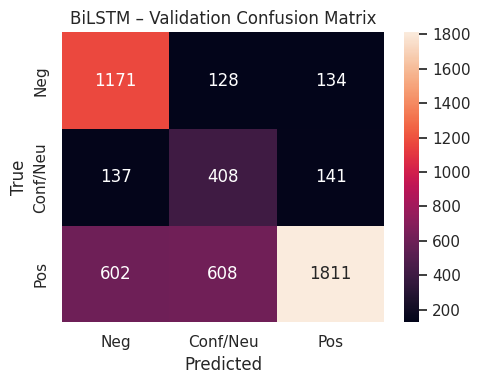

21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step

=== BiLSTM – Test ===
              precision    recall  f1-score   support

         Neg       0.61      0.82      0.70      1434
    Conf/Neu       0.33      0.57      0.42       686
         Pos       0.87      0.58      0.70      3021

    accuracy                           0.65      5141
   macro avg       0.60      0.66      0.61      5141
weighted avg       0.72      0.65      0.66      5141



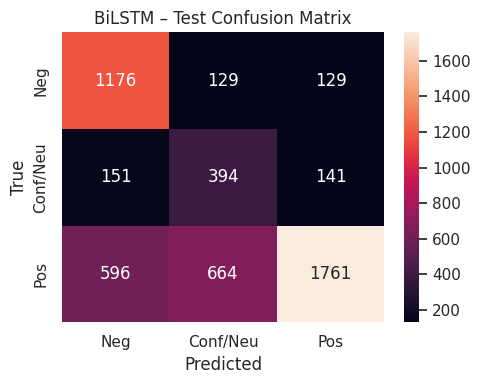

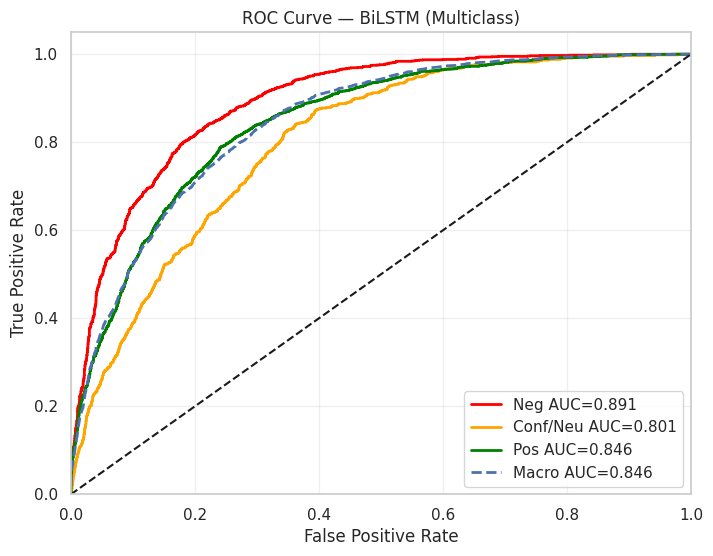

In [40]:
# reload best BiLSTM weights
bilstm_model.load_weights(bilstm_ckpt)

label_names = [id2label[i] for i in range(len(label2id))]

# Validation
y_val_probs_bilstm = bilstm_model.predict(X_val_pad, batch_size=256, verbose=1)
y_val_pred_bilstm  = np.argmax(y_val_probs_bilstm, axis=1)

print("=== BiLSTM – Validation ===")
print(classification_report(y_val_dl, y_val_pred_bilstm, target_names=label_names))

cm_val_bilstm = confusion_matrix(y_val_dl, y_val_pred_bilstm)
plt.figure(figsize=(5,4))
sns.heatmap(cm_val_bilstm, annot=True, fmt="d",
            xticklabels=label_names, yticklabels=label_names)
plt.title("BiLSTM – Validation Confusion Matrix")
plt.xlabel("Predicted"); plt.ylabel("True")
plt.tight_layout(); plt.show()

#  Test
y_test_probs_bilstm = bilstm_model.predict(X_test_pad, batch_size=256, verbose=1)
y_test_pred_bilstm  = np.argmax(y_test_probs_bilstm, axis=1)

print("\n=== BiLSTM – Test ===")
print(classification_report(y_test_dl, y_test_pred_bilstm, target_names=label_names))

cm_test_bilstm = confusion_matrix(y_test_dl, y_test_pred_bilstm)
plt.figure(figsize=(5,4))
sns.heatmap(cm_test_bilstm, annot=True, fmt="d",
            xticklabels=label_names, yticklabels=label_names)
plt.title("BiLSTM – Test Confusion Matrix")
plt.xlabel("Predicted"); plt.ylabel("True")
plt.tight_layout(); plt.show()

#  ROC Curve (multiclass, test set)
y_test_true = y_test_dl
y_test_bin  = label_binarize(y_test_true, classes=[0,1,2])
fpr, tpr, roc_auc = {}, {}, {}

for i in [0,1,2]:
    fpr[i], tpr[i], _ = roc_curve(y_test_bin[:, i], y_test_probs_bilstm[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

all_fpr = np.unique(np.concatenate([fpr[i] for i in [0,1,2]]))
mean_tpr = np.zeros_like(all_fpr)
for i in [0,1,2]:
    mean_tpr += np.interp(all_fpr, fpr[i], tpr[i])
mean_tpr /= 3
roc_auc_macro = auc(all_fpr, mean_tpr)

plt.figure(figsize=(8,6))
colors = ["red", "orange", "green"]
for i, c in zip([0,1,2], colors):
    plt.plot(fpr[i], tpr[i], c, lw=2,
             label=f"{id2label[i]} AUC={roc_auc[i]:.3f}")

plt.plot(all_fpr, mean_tpr, "b--", lw=2,
         label=f"Macro AUC={roc_auc_macro:.3f}")
plt.plot([0,1],[0,1],"k--")
plt.xlim([0,1]); plt.ylim([0,1.05])
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC Curve — BiLSTM (Multiclass)")
plt.legend(loc="lower right")
plt.grid(alpha=0.3)
plt.show()


In [41]:
# BiLSTM — LIME TEXT XAI + REAL-TIME PREDICTIONS + RISK
from lime.lime_text import LimeTextExplainer
from tensorflow.keras.preprocessing.sequence import pad_sequences
import numpy as np

label_names = ["Neg", "Conf/Neu", "Pos"]
risk_map = {
    "Neg": "High Risk",
    "Conf/Neu": "Medium Risk",
    "Pos": "Low Risk",
}

MAX_LEN = 150  # same as used in your BiLSTM training

# ---------- 1) LIME wrapper for BiLSTM ----------
def bilstm_predict_proba(texts):
    seqs = tokenizer.texts_to_sequences(texts)
    pads = pad_sequences(seqs, maxlen=MAX_LEN, padding="post", truncating="post")
    return bilstm_model.predict(pads)

explainer_bilstm = LimeTextExplainer(class_names=label_names)

# Pick one validation example to explain
example_idx = 10  # change if you want
y_val_array = np.array(y_val_dl)
text_example = X_val_text[example_idx]
true_label  = label_names[int(y_val_array[example_idx])]

print(f"=== BiLSTM — LIME EXPLANATION (val index {example_idx}) ===")
print("True label:", true_label)
print("\nText:\n", text_example)

exp_bilstm = explainer_bilstm.explain_instance(
    text_example,
    bilstm_predict_proba,
    num_features=10
)

# Nice HTML view (with highlighted tokens)
exp_bilstm.show_in_notebook(text=True)

# ---------- 2) REAL-TIME PREDICTIONS + RISK (BiLSTM) ----------
example_texts = [
    "The lectures are poorly structured and I rarely understand the topics. Overall, this module feels frustrating.",
    "Some weeks are clear, some are confusing, overall it's okay but I am not fully confident.",
    "The lecturer is amazing, explains everything clearly and the module is very engaging."
]

seqs_ex = tokenizer.texts_to_sequences(example_texts)
pads_ex = pad_sequences(seqs_ex, maxlen=MAX_LEN, padding="post", truncating="post")
probs_ex = bilstm_model.predict(pads_ex)
pred_idx = np.argmax(probs_ex, axis=1)

print("\n=== REAL-TIME PREDICTIONS + RISK (BiLSTM) ===")
for text, idx, prob in zip(example_texts, pred_idx, probs_ex):
    label = label_names[int(idx)]
    risk  = risk_map[label]
    print("\nText:", text)
    print("Predicted label:", label)
    print("Risk level:", risk)
    print("Class probabilities [Neg, Conf/Neu, Pos]:", np.round(prob, 3))


=== BiLSTM — LIME EXPLANATION (val index 10) ===
True label: Pos

Text:
 think that be not neg_go neg_to neg_like this course at all and that it be go to be dry it be not neg_at neg_all this course be an incredibly important and amazing course which touch on the philosophy of compute elaborate on material learn in and provide concrete and interesting proof and argument towards many well known conclusion such the halting problem the final grade receive in this course be felt that all of the assignment and exam minus the final assignment which felt be unfair be fair though challenging and that my relatively poor performance be entirely my own highly recommend take this course with teacher if you be give the opportunity
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step

=== REAL-TIME PREDICTIONS + RISK (BiLSTM) ===

Text: The lectures are poorly structured and I rarely understand the topics. Overall, this module feels frustrating.
Predicted label: Neg
Risk level: High Risk
Class probabilities [Neg, Conf/Neu, Pos]: [0.697 0.175 0.128]

Text: Some weeks are clear, some are confusing, overall it's okay but I am not fully confident.
Predicted label: Conf/Neu
Risk level: Medium Risk
Class probabilities [Neg, Conf/Neu, Pos]: [0.174 0.564 0.262]

Text: The lecturer is amazing, explains everything clearly and the module is very engaging.
Predicted label: Pos
Risk level: Low Risk
Class probabilities [Neg, Conf/Neu, Pos]: [0.032 0.166 0.802]


# CNN

In [42]:
#  CNN MODEL: BUILD + TRAIN
n_classes = len(id2label)

def build_cnn_model(vocab_size, max_len, n_classes=3,
                    emb_dim=128, num_filters=128, kernel_size=3):
    model = models.Sequential()
    model.add(layers.Embedding(
        input_dim=vocab_size,
        output_dim=emb_dim,
        input_shape=(max_len,)
    ))
    model.add(layers.Conv1D(
        filters=num_filters,
        kernel_size=kernel_size,
        activation="relu"
    ))
    model.add(layers.GlobalMaxPooling1D())
    model.add(layers.Dense(64, activation="relu"))
    model.add(layers.Dropout(0.3))
    model.add(layers.Dense(n_classes, activation="softmax"))

    model.compile(
        loss="sparse_categorical_crossentropy",
        optimizer=tf.keras.optimizers.Adam(learning_rate=1e-3),
        metrics=["accuracy"],
    )
    return model

cnn_model = build_cnn_model(
    vocab_size=vocab_size,
    max_len=MAX_LEN,
    n_classes=n_classes
)

cnn_model.build(input_shape=(None, MAX_LEN))
cnn_model.summary()

cnn_ckpt = "cnn_best.keras"

es_cnn = EarlyStopping(
    monitor="val_loss",
    patience=3,
    restore_best_weights=True,
    verbose=1,
)

mc_cnn = ModelCheckpoint(
    filepath=cnn_ckpt,
    monitor="val_loss",
    save_best_only=True,
    verbose=1,
)

history_cnn = cnn_model.fit(
    X_train_pad,
    y_train_dl,
    validation_data=(X_val_pad, y_val_dl),
    epochs=10,
    batch_size=128,
    class_weight=class_weight_dict,
    callbacks=[es_cnn, mc_cnn],
    verbose=1,
)


/usr/local/lib/python3.12/dist-packages/keras/src/layers/core/embedding.py:100: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Model: "sequential_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ embedding_1 (Embedding)         │ (None, 150, 128)       │     1,903,616 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv1d (Conv1D)                 │ (None, 148, 128)       │        49,280 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_max_pooling1d_1          │ (None, 128)            │             0 │
│ (GlobalMaxPooling1D)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5 (Dense)                 │ (None, 64)             │         8,256 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_3 (Dropout)             │ (None, 64)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_6 (Dense)                 │ (None, 3)              │           195 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 1,961,347 (7.48 MB)

 Trainable params: 1,961,347 (7.48 MB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/10
188/188 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.4381 - loss: 1.0018
Epoch 1: val_loss improved from inf to 0.73704, saving model to cnn_best.keras
188/188 ━━━━━━━━━━━━━━━━━━━━ 8s 26ms/step - accuracy: 0.4386 - loss: 1.0012 - val_accuracy: 0.6430 - val_loss: 0.7370
Epoch 2/10
184/188 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.6741 - loss: 0.6941
Epoch 2: val_loss improved from 0.73704 to 0.69495, saving model to cnn_best.keras
188/188 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - accuracy: 0.6746 - loss: 0.6933 - val_accuracy: 0.6741 - val_loss: 0.6949
Epoch 3/10
187/188 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.7500 - loss: 0.5551
Epoch 3: val_loss did not improve from 0.69495
188/188 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - accuracy: 0.7502 - loss: 0.5547 - val_accuracy: 0.6829 - val_loss: 0.7043
Epoch 4/10
186/188 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.8267 - loss: 0.4078
Epoch 4: val_loss did not improve from 0.69495
188/188 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - accu

21/21 ━━━━━━━━━━━━━━━━━━━━ 1s 16ms/step
=== CNN – Validation ===
              precision    recall  f1-score   support

         Neg       0.65      0.82      0.73      1433
    Conf/Neu       0.35      0.59      0.44       686
         Pos       0.86      0.63      0.73      3021

    accuracy                           0.67      5140
   macro avg       0.62      0.68      0.63      5140
weighted avg       0.74      0.67      0.69      5140



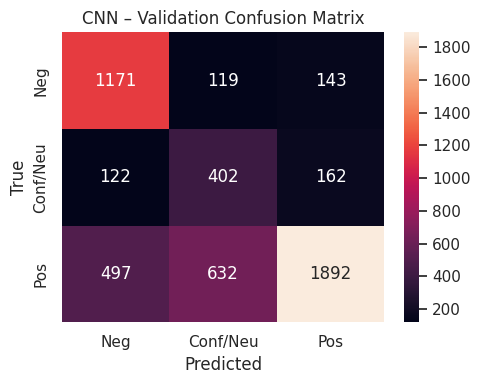

21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step

=== CNN – Test ===
              precision    recall  f1-score   support

         Neg       0.64      0.80      0.71      1434
    Conf/Neu       0.34      0.59      0.43       686
         Pos       0.86      0.61      0.71      3021

    accuracy                           0.66      5141
   macro avg       0.61      0.67      0.62      5141
weighted avg       0.73      0.66      0.68      5141



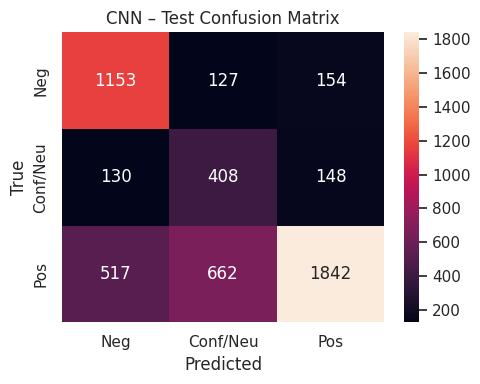

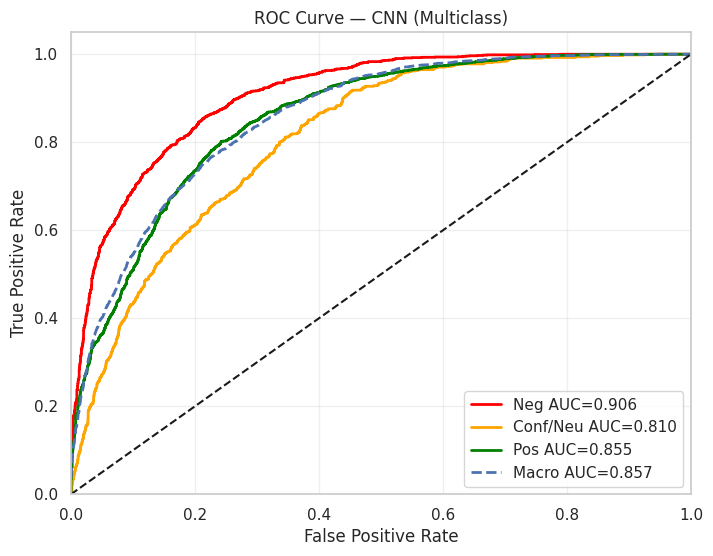

In [43]:
from sklearn.metrics import classification_report, confusion_matrix, roc_curve, auc
from sklearn.preprocessing import label_binarize

# Validation evaluation
y_val_probs_cnn = cnn_model.predict(X_val_pad, batch_size=256, verbose=1)
y_val_pred_cnn = np.argmax(y_val_probs_cnn, axis=1)

print("=== CNN – Validation ===")
print(classification_report(y_val_dl, y_val_pred_cnn, target_names=[id2label[0], id2label[1], id2label[2]]))

cm_val = confusion_matrix(y_val_dl, y_val_pred_cnn)
plt.figure(figsize=(5,4))
sns.heatmap(cm_val, annot=True, fmt="d",
            xticklabels=[id2label[0],id2label[1],id2label[2]],
            yticklabels=[id2label[0],id2label[1],id2label[2]])
plt.title("CNN – Validation Confusion Matrix")
plt.xlabel("Predicted"); plt.ylabel("True")
plt.tight_layout(); plt.show()

# Test evaluation
y_test_probs_cnn = cnn_model.predict(X_test_pad, batch_size=256, verbose=1)
y_test_pred_cnn = np.argmax(y_test_probs_cnn, axis=1)

print("\n=== CNN – Test ===")
print(classification_report(y_test_dl, y_test_pred_cnn, target_names=[id2label[0],id2label[1],id2label[2]]))

cm_test = confusion_matrix(y_test_dl, y_test_pred_cnn)
plt.figure(figsize=(5,4))
sns.heatmap(cm_test, annot=True, fmt="d",
            xticklabels=[id2label[0],id2label[1],id2label[2]],
            yticklabels=[id2label[0],id2label[1],id2label[2]])
plt.title("CNN – Test Confusion Matrix")
plt.xlabel("Predicted"); plt.ylabel("True")
plt.tight_layout(); plt.show()

# ROC Curve
y_bin = label_binarize(y_test_dl, classes=[0,1,2])
fpr, tpr, roc_auc = {}, {}, {}

for i in [0,1,2]:
    fpr[i], tpr[i], _ = roc_curve(y_bin[:,i], y_test_probs_cnn[:,i])
    roc_auc[i] = auc(fpr[i], tpr[i])

all_fpr = np.unique(np.concatenate([fpr[i] for i in [0,1,2]]))
mean_tpr = np.zeros_like(all_fpr)
for i in [0,1,2]:
    mean_tpr += np.interp(all_fpr, fpr[i], tpr[i])
mean_tpr /= 3
roc_auc_macro = auc(all_fpr, mean_tpr)

plt.figure(figsize=(8,6))
colors = ["red","orange","green"]
labels = [id2label[0], id2label[1], id2label[2]]

for i, c in zip([0,1,2], colors):
    plt.plot(fpr[i], tpr[i], c, lw=2, label=f"{labels[i]} AUC={roc_auc[i]:.3f}")

plt.plot(all_fpr, mean_tpr, "b--", lw=2, label=f"Macro AUC={roc_auc_macro:.3f}")
plt.plot([0,1],[0,1],"k--"); plt.xlim([0,1]); plt.ylim([0,1.05])
plt.xlabel("False Positive Rate"); plt.ylabel("True Positive Rate")
plt.title("ROC Curve — CNN (Multiclass)")
plt.legend(loc="lower right"); plt.grid(alpha=0.3)
plt.show()


In [44]:
# CNN — LIME TEXT XAI + REAL-TIME PREDICTIONS + RISK
label_names = ["Neg", "Conf/Neu", "Pos"]
risk_map = {
    "Neg": "High Risk",
    "Conf/Neu": "Medium Risk",
    "Pos": "Low Risk",
}

MAX_LEN = 150

#  1) LIME wrapper for CNN
def cnn_predict_proba(texts):
    seqs = tokenizer.texts_to_sequences(texts)
    pads = pad_sequences(seqs, maxlen=MAX_LEN, padding="post", truncating="post")
    return cnn_model.predict(pads)

explainer_cnn = LimeTextExplainer(class_names=label_names)

# Pick one validation example to explain
example_idx = 10  # change if you want
y_val_array = np.array(y_val_dl)
text_example = X_val_text[example_idx]
true_label  = label_names[int(y_val_array[example_idx])]

print(f"=== CNN — LIME EXPLANATION (val index {example_idx}) ===")
print("True label:", true_label)
print("\nText:\n", text_example)

exp_cnn = explainer_cnn.explain_instance(
    text_example,
    cnn_predict_proba,
    num_features=10
)

exp_cnn.show_in_notebook(text=True)

#  2) REAL-TIME PREDICTIONS + RISK (CNN)
example_texts = [
    "The lectures are poorly structured and I rarely understand the topics. Overall, this module feels frustrating.",
    "Some weeks are clear, some are confusing, overall it's okay but I am not fully confident.",
    "The lecturer is amazing, explains everything clearly and the module is very engaging."
]

seqs_ex = tokenizer.texts_to_sequences(example_texts)
pads_ex = pad_sequences(seqs_ex, maxlen=MAX_LEN, padding="post", truncating="post")
probs_ex = cnn_model.predict(pads_ex)
pred_idx = np.argmax(probs_ex, axis=1)

print("\n=== REAL-TIME PREDICTIONS + RISK (CNN) ===")
for text, idx, prob in zip(example_texts, pred_idx, probs_ex):
    label = label_names[int(idx)]
    risk  = risk_map[label]
    print("\nText:", text)
    print("Predicted label:", label)
    print("Risk level:", risk)
    print("Class probabilities [Neg, Conf/Neu, Pos]:", np.round(prob, 3))


=== CNN — LIME EXPLANATION (val index 10) ===
True label: Pos

Text:
 think that be not neg_go neg_to neg_like this course at all and that it be go to be dry it be not neg_at neg_all this course be an incredibly important and amazing course which touch on the philosophy of compute elaborate on material learn in and provide concrete and interesting proof and argument towards many well known conclusion such the halting problem the final grade receive in this course be felt that all of the assignment and exam minus the final assignment which felt be unfair be fair though challenging and that my relatively poor performance be entirely my own highly recommend take this course with teacher if you be give the opportunity
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 332ms/step

=== REAL-TIME PREDICTIONS + RISK (CNN) ===

Text: The lectures are poorly structured and I rarely understand the topics. Overall, this module feels frustrating.
Predicted label: Neg
Risk level: High Risk
Class probabilities [Neg, Conf/Neu, Pos]: [0.916 0.057 0.026]

Text: Some weeks are clear, some are confusing, overall it's okay but I am not fully confident.
Predicted label: Neg
Risk level: High Risk
Class probabilities [Neg, Conf/Neu, Pos]: [0.436 0.417 0.147]

Text: The lecturer is amazing, explains everything clearly and the module is very engaging.
Predicted label: Pos
Risk level: Low Risk
Class probabilities [Neg, Conf/Neu, Pos]: [0.012 0.117 0.871]


# **DistilBERT**

In [16]:
!pip install -q transformers datasets scikit-learn

import numpy as np
import torch
import matplotlib.pyplot as plt

from datasets import Dataset, DatasetDict
from transformers import (
    AutoTokenizer,
    AutoModelForSequenceClassification,
    DataCollatorWithPadding,
    TrainingArguments,
    Trainer
)
from sklearn.metrics import (
    accuracy_score,
    f1_score,
    classification_report,
    confusion_matrix,
    ConfusionMatrixDisplay
)

device = "cuda" if torch.cuda.is_available() else "cpu"
print("Using device:", device)

# 1) Build HF datasets
X_train_list = list(X_train_text)
X_val_list   = list(X_val_text)
X_test_list  = list(X_test_text)

y_train_list = [int(x) for x in y_train]
y_val_list   = [int(x) for x in y_val]
y_test_list  = [int(x) for x in y_test]

train_n = min(12000, len(X_train_list))
val_n   = min(3000, len(X_val_list))
test_n  = min(3000, len(X_test_list))

train_ds = Dataset.from_dict({
    "text":  X_train_list[:train_n],
    "label": y_train_list[:train_n]
})
val_ds = Dataset.from_dict({
    "text":  X_val_list[:val_n],
    "label": y_val_list[:val_n]
})
test_ds = Dataset.from_dict({
    "text":  X_test_list[:test_n],
    "label": y_test_list[:test_n]
})

raw_datasets = DatasetDict({
    "train": train_ds,
    "validation": val_ds,
    "test": test_ds
})

print(f"Train: {len(train_ds)}, Val: {len(val_ds)}, Test: {len(test_ds)}")

# 2) Tokenisation
model_name = "distilbert-base-uncased"
tokenizer = AutoTokenizer.from_pretrained(model_name)

def tokenize_fn(batch):
    return tokenizer(
        batch["text"],
        truncation=True,
        padding=False,
        max_length=128,
    )

tokenized_datasets = raw_datasets.map(tokenize_fn, batched=True)
data_collator = DataCollatorWithPadding(tokenizer=tokenizer)

# 3) Model + metrics + Trainer
def compute_metrics(eval_pred):
    logits, labels = eval_pred
    preds = np.argmax(logits, axis=-1)
    return {
        "accuracy": accuracy_score(labels, preds),
        "macro_f1": f1_score(labels, preds, average="macro"),
        "weighted_f1": f1_score(labels, preds, average="weighted"),
    }

model = AutoModelForSequenceClassification.from_pretrained(
    model_name,
    num_labels=3,
)

training_args = TrainingArguments(
    output_dir="distilbert-final",
    num_train_epochs=1,
    per_device_train_batch_size=16,
    per_device_eval_batch_size=32,
    learning_rate=2e-5,
    weight_decay=0.01,
    logging_steps=100,
    save_steps=5000,
    fp16=(device == "cuda"),
    report_to="none",
)

trainer = Trainer(
    model=model,
    args=training_args,
    train_dataset=tokenized_datasets["train"],
    eval_dataset=tokenized_datasets["validation"],
    tokenizer=tokenizer,
    data_collator=data_collator,
    compute_metrics=compute_metrics,
)

# 4) Train
print("\nTraining DistilBERT (final) ===")
trainer.train()

Using device: cuda
Train: 12000, Val: 3000, Test: 3000


/usr/local/lib/python3.12/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


Map:   0%|          | 0/12000 [00:00<?, ? examples/s]

Map:   0%|          | 0/3000 [00:00<?, ? examples/s]

Map:   0%|          | 0/3000 [00:00<?, ? examples/s]

Some weights of DistilBertForSequenceClassification were not initialized from the model checkpoint at distilbert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight', 'pre_classifier.bias', 'pre_classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
/tmp/ipython-input-1184017347.py:103: FutureWarning: `tokenizer` is deprecated and will be removed in version 5.0.0 for `Trainer.__init__`. Use `processing_class` instead.
  trainer = Trainer(



Training DistilBERT (final) ===


Step,Training Loss
100,0.869100
200,0.663000
300,0.671700
400,0.591500
500,0.562000
600,0.603500
700,0.588000


TrainOutput(global_step=750, training_loss=0.6432155049641927, metrics={'train_runtime': 41.1796, 'train_samples_per_second': 291.407, 'train_steps_per_second': 18.213, 'total_flos': 322638382334016.0, 'train_loss': 0.6432155049641927, 'epoch': 1.0})


 DistilBERT – Validation metrics 


{'eval_loss': 0.547421932220459, 'eval_accuracy': 0.7733333333333333, 'eval_macro_f1': 0.6462337930422746, 'eval_weighted_f1': 0.7549001440391402, 'eval_runtime': 2.5164, 'eval_samples_per_second': 1192.167, 'eval_steps_per_second': 37.355, 'epoch': 1.0}

 DistilBERT – Test metrics 
{'eval_loss': 0.5672429800033569, 'eval_accuracy': 0.7626666666666667, 'eval_macro_f1': 0.593635121661143, 'eval_weighted_f1': 0.7346164232931172, 'eval_runtime': 2.3804, 'eval_samples_per_second': 1260.281, 'eval_steps_per_second': 39.489, 'epoch': 1.0}

 DistilBERT – Test classification report 
              precision    recall  f1-score   support

         Neg       0.75      0.71      0.73       829
    Conf/Neu       0.39      0.13      0.20       380
         Pos       0.79      0.92      0.85      1791

    accuracy                           0.76      3000
   macro avg       0.65      0.59      0.59      3000
weighted avg       0.73      0.76      0.73      3000



<Figure size 600x500 with 0 Axes>

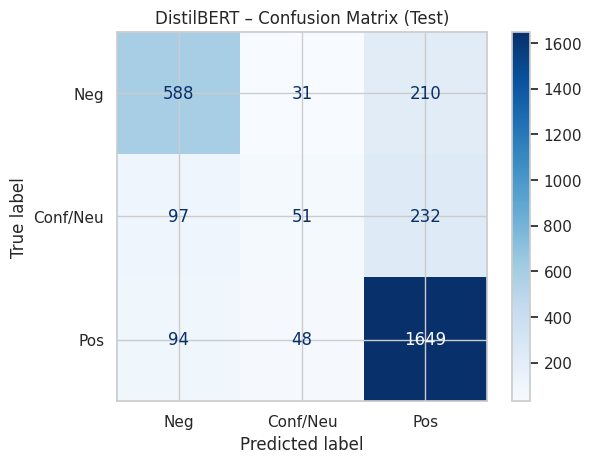

In [19]:

# 5) Validation + Test evaluation  (FIXED)

labels = ["Neg", "Conf/Neu", "Pos"]
print("\n DistilBERT – Validation metrics ")
val_metrics = trainer.evaluate(tokenized_datasets["validation"])
print(val_metrics)

print("\n DistilBERT – Test metrics ")
test_metrics = trainer.evaluate(tokenized_datasets["test"])
print(test_metrics)

print("\n DistilBERT – Test classification report ")

pred_test = trainer.predict(tokenized_datasets["test"])
y_test_pred = np.argmax(pred_test.predictions, axis=-1)
y_test_true = test_ds["label"]
print(classification_report(
    y_test_true,
    y_test_pred,
    target_names=labels
))

# Confusion matrix
cm = confusion_matrix(y_test_true, y_test_pred)
plt.figure(figsize=(6, 5))
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=labels)
disp.plot(cmap="Blues", values_format="d")
plt.title("DistilBERT – Confusion Matrix (Test)")
plt.show()


In [20]:
# SHAP XAI for DistilBERT – word-level contribution + predictions

!pip install -q shap
import shap
import numpy as np

model.to(device)
model.eval()

labels = ["Neg", "Conf/Neu", "Pos"]

# Prediction function for SHAP
def distilbert_predict_proba(text_list):
    enc = tokenizer(
        list(text_list),
        truncation=True,
        padding=True,
        max_length=128,
        return_tensors="pt"
    ).to(device)

    with torch.no_grad():
        out = model(**enc)
        probs = torch.softmax(out.logits, dim=-1).cpu().numpy()
    return probs

# SHAP text explainer
masker = shap.maskers.Text(tokenizer)
explainer = shap.Explainer(distilbert_predict_proba, masker, output_names=labels)

y_test_arr = np.array(y_test_list[:test_n])
X_test_arr = np.array(X_test_list[:test_n])

def first_index_of_class(c):
    idxs = np.where(y_test_arr == c)[0]
    return int(idxs[0]) if len(idxs) > 0 else None

idx_neg  = first_index_of_class(0)
idx_conf = first_index_of_class(1)
idx_pos  = first_index_of_class(2)

example_indices = [i for i in [idx_neg, idx_conf, idx_pos] if i is not None]
example_texts   = [X_test_arr[i] for i in example_indices]
example_true    = [labels[y_test_arr[i]] for i in example_indices]

# Get actual model predictions for these examples
probs = distilbert_predict_proba(example_texts)
pred_ids = probs.argmax(axis=1)
pred_labels = [labels[i] for i in pred_ids]

print(" DistilBERT predictions on selected test examples")
for i, txt in enumerate(example_texts):
    print(f"\nExample {i+1}")
    print("-" * 40)
    print("Text        :", txt)
    print("True label  :", example_true[i])
    print("Pred label  :", pred_labels[i])
    print("Probabilities (Neg, Conf/Neu, Pos):",
          np.round(probs[i], 3))

# SHAP explanations (word-level heatmaps)
print("\nGenerating SHAP explanations (this may take ~1–2 minutes)...")
shap_values = explainer(example_texts, max_evals=500)

for i, txt in enumerate(example_texts):
    print(f"\n SHAP text explanation for Example {i+1} "
          f"(true: {example_true[i]}, pred: {pred_labels[i]}) ")
    shap.plots.text(shap_values[i])


 DistilBERT predictions on selected test examples

Example 1
----------------------------------------
Text        : never neg_ever neg_see neg_the bad instuctor like her
True label  : Neg
Pred label  : Neg
Probabilities (Neg, Conf/Neu, Pos): [0.879 0.054 0.067]

Example 2
----------------------------------------
Text        : lot of people find this class hard but find that as long you go to class and do the practice problem you will pass he will even bump up your grade if you be on the cusp and he know you attend class
True label  : Conf/Neu
Pred label  : Conf/Neu
Probabilities (Neg, Conf/Neu, Pos): [0.175 0.562 0.263]

Example 3
----------------------------------------
Text        : the ta be picky about the lab but very enjoyable and easy course
True label  : Pos
Pred label  : Pos
Probabilities (Neg, Conf/Neu, Pos): [0.018 0.036 0.946]

Generating SHAP explanations (this may take ~1–2 minutes)...

 SHAP text explanation for Example 1 (true: Neg, pred: Neg) 



 SHAP text explanation for Example 2 (true: Conf/Neu, pred: Conf/Neu) 



 SHAP text explanation for Example 3 (true: Pos, pred: Pos) 


In [21]:
# DistilBERT – Risk mapping helper + example predictions

labels = ["Neg", "Conf/Neu", "Pos"]
id2label = {i: lab for i, lab in enumerate(labels)}
risk_map = {
    "Neg": "High risk",
    "Conf/Neu": "Medium risk",
    "Pos": "Low risk",
}

def distilbert_predict_with_risk(text):
    enc = tokenizer(
        [text],
        truncation=True,
        padding=True,
        max_length=128,
        return_tensors="pt"
    ).to(device)

    with torch.no_grad():
        out = model(**enc)
        probs = torch.softmax(out.logits, dim=-1).cpu().numpy()[0]

    pred_id = int(np.argmax(probs))
    pred_label = id2label[pred_id]
    pred_risk = risk_map[pred_label]

    return {
        "text": text,
        "label": pred_label,
        "risk": pred_risk,
        "probs": dict(zip(labels, np.round(probs, 3)))
    }

# Example texts
examples = [
    "I felt completely lost in this module and the support was terrible.",
    "Some lectures were useful but overall I am still unsure about the content.",
    "The lecturer was very supportive and the explanations were clear and engaging."
]

print(" DistilBERT risk-aware predictions ")
for i, t in enumerate(examples, 1):
    res = distilbert_predict_with_risk(t)
    print(f"\nExample {i}")
    print("Text :", res["text"])
    print("Pred :", res["label"], "| Risk:", res["risk"])
    print("Probs:", res["probs"])


 DistilBERT risk-aware predictions 

Example 1
Text : I felt completely lost in this module and the support was terrible.
Pred : Neg | Risk: High risk
Probs: {'Neg': np.float32(0.748), 'Conf/Neu': np.float32(0.04), 'Pos': np.float32(0.212)}

Example 2
Text : Some lectures were useful but overall I am still unsure about the content.
Pred : Pos | Risk: Low risk
Probs: {'Neg': np.float32(0.41), 'Conf/Neu': np.float32(0.041), 'Pos': np.float32(0.549)}

Example 3
Text : The lecturer was very supportive and the explanations were clear and engaging.
Pred : Pos | Risk: Low risk
Probs: {'Neg': np.float32(0.035), 'Conf/Neu': np.float32(0.079), 'Pos': np.float32(0.887)}


#GPT Fine Tuning

In [25]:
!pip install -q transformers>=4.46.0 accelerate>=1.1.0 peft datasets

import torch, math
from datasets import Dataset
from transformers import (
    AutoTokenizer, AutoModelForCausalLM,
    TrainingArguments, Trainer,
    DataCollatorForLanguageModeling
)
from peft import LoraConfig, get_peft_model, TaskType

device = "cuda" if torch.cuda.is_available() else "cpu"
print("Using device:", device)

# 1. Collect a LARGER training corpus
max_samples = min(12000, len(X_train_text))
corpus = list(X_train_text[:max_samples])

train_ds = Dataset.from_dict({"text": corpus})

# 2. Load GPT-2 + LoRA
model_name = "gpt2"

tokenizer = AutoTokenizer.from_pretrained(model_name)
tokenizer.pad_token = tokenizer.eos_token

model = AutoModelForCausalLM.from_pretrained(
    model_name,
    torch_dtype=torch.float16 if device == "cuda" else torch.float32,
).to(device)

#  FIXED LoRA BLOCK
lora_cfg = LoraConfig(
    r=16,
    lora_alpha=32,
    lora_dropout=0.05,
    bias="none",
    task_type=TaskType.CAUSAL_LM
)

model = get_peft_model(model, lora_cfg)

# 3. Tokenisation
def tok(batch):
    return tokenizer(
        batch["text"],
        truncation=True,
        padding="max_length",
        max_length=128
    )

train_tok = train_ds.map(tok, batched=True)
train_tok.set_format(type="torch", columns=["input_ids", "attention_mask"])

data_collator = DataCollatorForLanguageModeling(tokenizer, mlm=False)

# 4. Training arguments
training_args = TrainingArguments(
    output_dir="gpt2-lora-lm-highquality",
    num_train_epochs=2,
    per_device_train_batch_size=4,
    gradient_accumulation_steps=8,
    learning_rate=2e-4,
    warmup_steps=100,
    logging_steps=50,
    save_steps=5000,
    fp16=(device == "cuda"),
    report_to="none",
)

trainer = Trainer(
    model=model,
    args=training_args,
    train_dataset=train_tok,
    data_collator=data_collator,
)

# 5. Train
print("\n=== Training GPT-2 LoRA (High Quality) ===")
trainer.train()
print("Training completed!")

# 6. Evaluate LM Loss + Perplexity
eval_res = trainer.evaluate(train_tok)
loss = eval_res["eval_loss"]
ppl = math.exp(loss)

print("\n===== GPT-2 LM METRICS =====")
print(f"Cross-Entropy Loss : {loss:.4f}")
print(f"Perplexity (PPL)   : {ppl:.4f}")


Using device: cuda


/usr/local/lib/python3.12/dist-packages/peft/tuners/lora/layer.py:2285: UserWarning: fan_in_fan_out is set to False but the target module is `Conv1D`. Setting fan_in_fan_out to True.
  warnings.warn(


Map:   0%|          | 0/12000 [00:00<?, ? examples/s]


=== Training GPT-2 LoRA (High Quality) ===


Step,Training Loss
50,5.686000
100,5.113100
150,4.538500
200,4.366400
250,4.321900
300,4.244000
350,4.273300
400,4.227800
450,4.195400
500,4.227900


Training completed!



===== GPT-2 LM METRICS =====
Cross-Entropy Loss : 4.0359
Perplexity (PPL)   : 56.5920


##GPT-2 LoRA Training Loss Curve

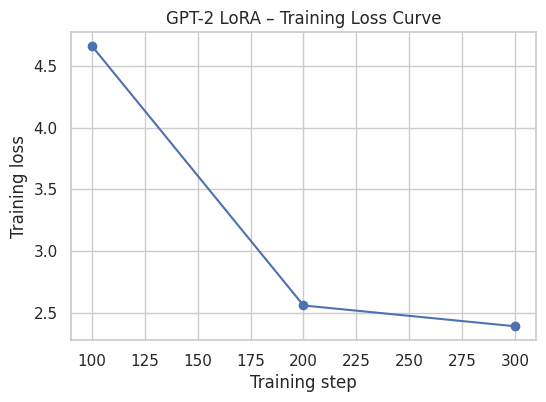

In [47]:
import matplotlib.pyplot as plt

logs = trainer.state.log_history
train_logs = [x for x in logs if "loss" in x and "step" in x]

steps = [x["step"] for x in train_logs]
losses = [x["loss"] for x in train_logs]

plt.figure(figsize=(6,4))
plt.plot(steps, losses, marker="o")
plt.xlabel("Training step")
plt.ylabel("Training loss")
plt.title("GPT-2 LoRA – Training Loss Curve")
plt.grid(True)
plt.show()


## GPT-2 LoRA Final Evaluation Metrics (Loss & Perplexity)

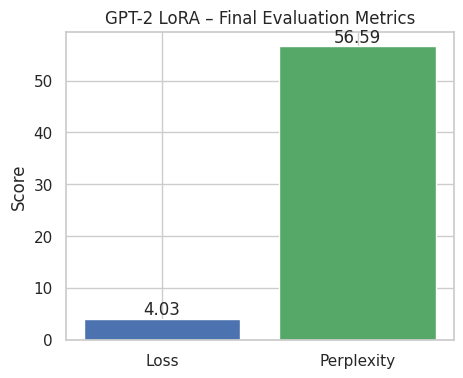

In [48]:
import matplotlib.pyplot as plt

loss = 4.03
ppl  = 56.59

plt.figure(figsize=(5,4))
metrics = ["Loss", "Perplexity"]
values  = [loss, ppl]

bars = plt.bar(metrics, values, color=['#4C72B0','#55A868'])
plt.title("GPT-2 LoRA – Final Evaluation Metrics")
plt.ylabel("Score")

for bar, v in zip(bars, values):
    plt.text(
        bar.get_x() + bar.get_width()/2,
        v,
        f"{v:.2f}",
        ha="center",
        va="bottom"
    )

plt.show()
